<h1>Preprocessing PDMC N Panel</h1>

In [1]:
import sys
if '/home/ross/immunova' not in sys.path:
    sys.path.append('/home/ross/immunova')
from immunova.data.mongo_setup import pd_init
from immunova.data.fcs_experiments import FCSExperiment
from immunova.flow.gating.actions import Gating, Template
from immunova.flow.gating.defaults import ChildPopulationCollection
from warnings import filterwarnings
from tqdm import tqdm_notebook
import matplotlib
import pandas as pd
import os
filterwarnings('ignore')
pd_init()

/home/ross/immunova/env/lib/python3.6/site-packages/sklearn/externals/six.py:31: DeprecationWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", DeprecationWarning)
/home/ross/immunova/env/lib/python3.6/site-packages/sklearn/externals/joblib/__init__.py:15: DeprecationWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=DeprecationWarning)


In [2]:
nexp = FCSExperiment.objects(experiment_id='PD_N_PDMCs').get()

In [3]:
nexp.list_samples()

['142-09_pdmc_n',
 '209-05_pdmc_n',
 '210-14_pdmc_n',
 '239-02_pdmc_n',
 '239-04_pdmc_n',
 '251-07_pdmc_n',
 '251-08_pdmc_n',
 '254-04_pdmc_n',
 '254-05_pdmc_n',
 '255-04_pdmc_n',
 '255-05_pdmc_n',
 '264-02_pdmc_n',
 '267-02_pdmc_n',
 '273-01_pdmc_n',
 '276-01_pdmc_n',
 '286-03_pdmc_n',
 '286-04_pdmc_n',
 '294-02_pdmc_n',
 '294-03_pdmc_n',
 '298-01_pdmc_n',
 '305-01_pdmc_n',
 '305-02_pdmc_n',
 '305-03_pdmc_n',
 '306-01_pdmc_n',
 '308-01_pdmc_n',
 '308-02R_pdmc_n',
 '308-03R_pdmc_n',
 '310-01_pdmc_n',
 '315-01_pdmc_n',
 '315-02_pdmc_n',
 '318-01_pdmc_n',
 '320-01_pdmc_n',
 '321-01_pdmc_n',
 '322-01_pdmc_n',
 '323-01_pdmc_n',
 '324-01_pdmc_n',
 '326-01_pdmc_n',
 '237-06_pdmc_n',
 '267-01_pdmc_n',
 '279-03_pdmc_n',
 '286-02_pdmc_n',
 '288-02_pdmc_n',
 '302-01_pdmc_n']

<h2>Create a Template</h2>

We will use the automated gates to isolate single Live CD45+ cells (all leukocytes).

In [4]:
nexp.delete_all_populations(sample_id='all', remove_gates=True)

In [5]:
nexp.delete_gating_templates(template_name='all')

In [6]:
n = Template(nexp, '142-09_pdmc_n')

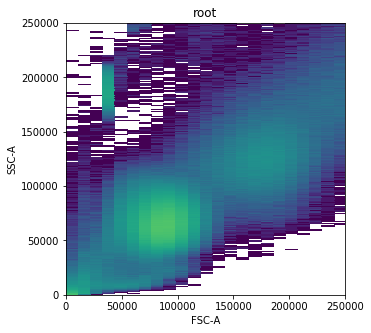

In [7]:
n.plotting.plot_population('root', 'FSC-A', 'SSC-A', transforms={'x':None, 'y':None})

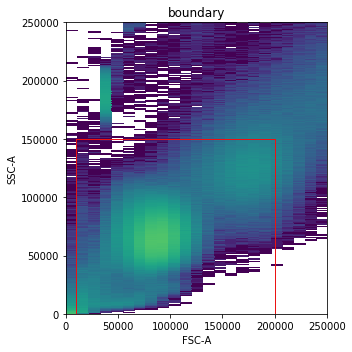

In [8]:
children = ChildPopulationCollection('geom')
children.add_population('cells', definition='+')
children.add_population('debris', definition='-')
kwargs = dict(x='FSC-A', y='SSC-A', transform_x=None, transform_y=None,
             x_min=10000, y_min=0, x_max=200000, y_max=150000)
n.create_gate(gate_name='boundary', 
              parent='root',
              class_='Static',
              method='rect_gate',
              child_populations=children, 
              kwargs=kwargs)
n.apply('boundary')

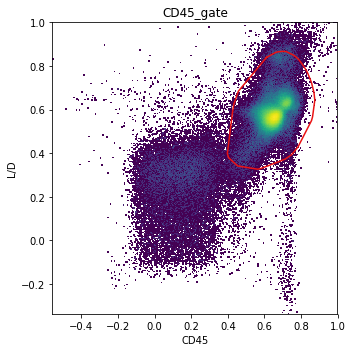

In [9]:
children = ChildPopulationCollection('cluster')
children.add_population('CD45+', target=(0.6, 0.6), weight=1)
kwargs = dict(x='CD45', y='L/D', transform_x='logicle', 
              transform_y='logicle', min_pop_size=100, frac=0.01)
n.create_gate(gate_name='CD45_gate', 
              parent='cells',
              class_='DensityBasedClustering',
              method='hdbscan',
              child_populations=children, 
              kwargs=kwargs)
n.apply('CD45_gate')

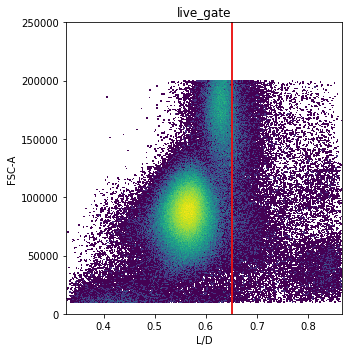

In [10]:
children = ChildPopulationCollection('threshold_1d')
children.add_population('dead', definition='+')
children.add_population('Live_CD45+', definition='-')
kwargs = dict(x='L/D', transform_x='logicle', kde_bw=0.05, low_memory=True, peak_threshold=0.05)
n.create_gate(gate_name='live_gate', 
              parent='CD45+',
              class_='DensityThreshold',
              method='gate_1d',
              child_populations=children, 
              kwargs=kwargs)
n.apply('live_gate')

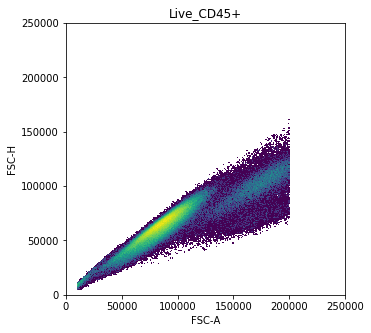

In [11]:
n.plotting.plot_population('Live_CD45+', 'FSC-A', 'FSC-H', transforms={'x':None,
                                                                       'y':None})

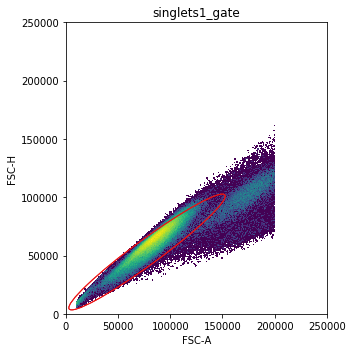

In [12]:
children = ChildPopulationCollection('geom')
children.add_population('singlets1', definition='+')
children.add_population('doublets1', definition='-')
kwargs = dict(x='FSC-A', y='FSC-H', transform_x=None, transform_y=None, target=(75000, 60000),
             conf=0.99)
n.create_gate(gate_name='singlets1_gate', 
              parent='Live_CD45+',
              class_='MixtureModel',
              method='gate',
              child_populations=children, 
              kwargs=kwargs)
n.apply('singlets1_gate')

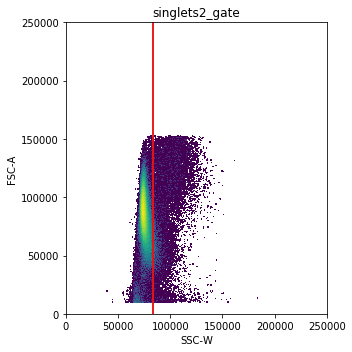

In [13]:
children = ChildPopulationCollection('threshold_1d')
children.add_population('doublets2', definition='+')
children.add_population('Single_Live_CD45+', definition='-')
kwargs = dict(x='SSC-W', transform_x=None, kde_bw=5000, low_memory=True,
             ignore_double_pos=False, peak_threshold=0.05)
n.create_gate(gate_name='singlets2_gate', 
              parent='singlets1',
              class_='DensityThreshold',
              method='gate_1d',
              child_populations=children, 
              kwargs=kwargs)
n.apply('singlets2_gate')

In [14]:
n.print_population_tree()

root
├── cells
│   └── CD45+
│       ├── dead
│       └── Live_CD45+
│           ├── singlets1
│           │   ├── doublets2
│           │   └── Single_Live_CD45+
│           └── doublets1
└── debris


In [15]:
n.clean('Single_Live_CD45+')

In [16]:
n.populations['Single_Live_CD45+_cleaned'].prop_of_parent

0.9751995332659892

In [17]:
n.save_new_template('PDMCn_Preprocessing', overwrite=True)

No existing template named PDMCn_Preprocessing, creating new template


True

<h3>Secondary template</h3>

In [77]:
nexp.delete_gating_templates('PDMCn_Preprocessing_Secondary')

In [78]:
n = Template(nexp, '254-05_pdmc_n')

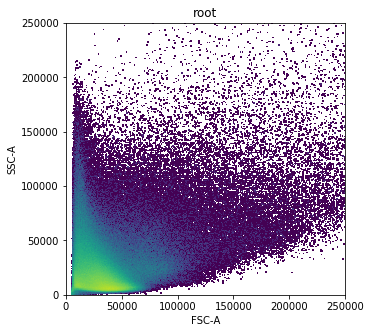

In [79]:
n.plotting.plot_population('root', 'FSC-A', 'SSC-A', transforms={'x':None, 'y':None})

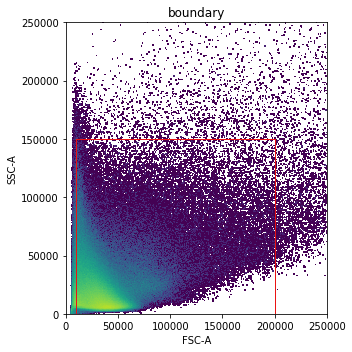

In [80]:
children = ChildPopulationCollection('geom')
children.add_population('cells', definition='+')
children.add_population('debris', definition='-')
kwargs = dict(x='FSC-A', y='SSC-A', transform_x=None, transform_y=None,
             x_min=10000, y_min=0, x_max=200000, y_max=150000)
n.create_gate(gate_name='boundary', 
              parent='root',
              class_='Static',
              method='rect_gate',
              child_populations=children, 
              kwargs=kwargs)
n.apply('boundary')

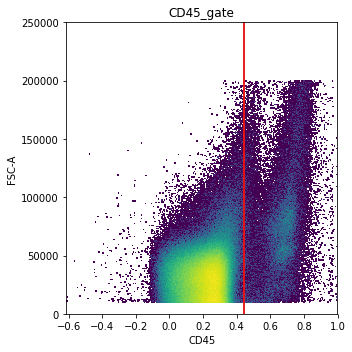

In [81]:
children = ChildPopulationCollection('threshold_1d')
children.add_population('CD45+', definition='+')
children.add_population('CD45-', definition='-')
kwargs = dict(x='CD45', transform_x='logicle', kde_bw=0.02, low_memory=True, peak_threshold=0.05,
             ignore_double_pos=True)
n.create_gate(gate_name='CD45_gate', 
              parent='cells',
              class_='DensityThreshold',
              method='gate_1d',
              child_populations=children, 
              kwargs=kwargs)
n.apply('CD45_gate')

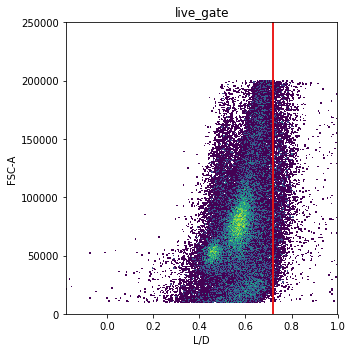

In [82]:
children = ChildPopulationCollection('threshold_1d')
children.add_population('dead', definition='+')
children.add_population('Live_CD45+', definition='-')
kwargs = dict(x='L/D', transform_x='logicle', kde_bw=0.05, low_memory=True, peak_threshold=0.05,
             ignore_double_pos=True)
n.create_gate(gate_name='live_gate', 
              parent='CD45+',
              class_='DensityThreshold',
              method='gate_1d',
              child_populations=children, 
              kwargs=kwargs)
n.apply('live_gate')

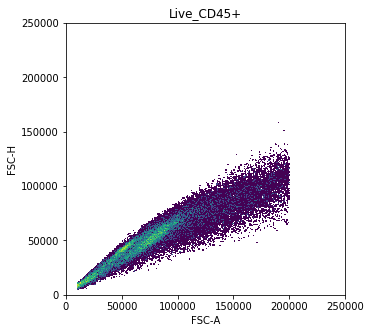

In [83]:
n.plotting.plot_population('Live_CD45+', 'FSC-A', 'FSC-H', transforms={'x':None,
                                                                       'y':None})

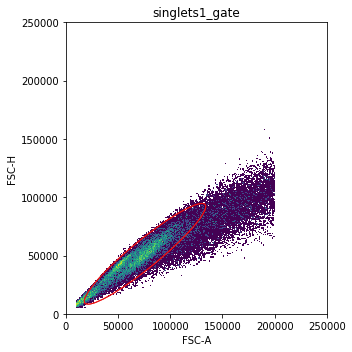

In [84]:
children = ChildPopulationCollection('geom')
children.add_population('singlets1', definition='+')
children.add_population('doublets1', definition='-')
kwargs = dict(x='FSC-A', y='FSC-H', transform_x=None, transform_y=None, target=(75000, 60000),
             conf=0.99)
n.create_gate(gate_name='singlets1_gate', 
              parent='Live_CD45+',
              class_='MixtureModel',
              method='gate',
              child_populations=children, 
              kwargs=kwargs)
n.apply('singlets1_gate')

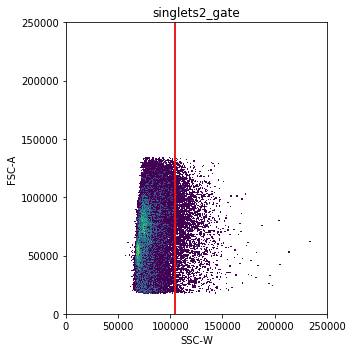

In [85]:
children = ChildPopulationCollection('threshold_1d')
children.add_population('doublets2', definition='+')
children.add_population('Single_Live_CD45+', definition='-')
kwargs = dict(x='SSC-W', transform_x=None, q=0.95)
n.create_gate(gate_name='singlets2_gate', 
              parent='singlets1',
              class_='Quantile',
              method='gate_1d',
              child_populations=children, 
              kwargs=kwargs)
n.apply('singlets2_gate')

In [86]:
n.print_population_tree()

root
├── cells
│   ├── CD45+
│   │   ├── dead
│   │   └── Live_CD45+
│   │       ├── singlets1
│   │       │   ├── doublets2
│   │       │   └── Single_Live_CD45+
│   │       └── doublets1
│   └── CD45-
└── debris


In [87]:
n.clean('Single_Live_CD45+')

In [88]:
n.populations['Single_Live_CD45+_cleaned'].prop_of_parent

0.9712536424057886

In [89]:
n.save_new_template('PDMCn_Preprocessing_Secondary', overwrite=True)

No existing template named PDMCn_Preprocessing_Secondary, creating new template


True

<h2>Apply the preprocessing template to all samples</h2>

In [70]:
samples = nexp.list_samples()

In [71]:
def apply_template(sample_id, template='secondary'):
    print(f'------------------ {sample_id} ------------------')
    n = Template(nexp, sample_id)
    if template == 'secondary':
        n.load_template('PDMCn_Preprocessing_Secondary')
    else:
        n.load_template('PDMCn_Preprocessing')
    n.apply_many(apply_all=True, plot_outcome=True)
    return n

<h3>142-09</h3>

------------------ 142-09_pdmc_n ------------------
Applying boundary...
Applying CD45_gate...
Applying live_gate...
Applying singlets1_gate...
Applying singlets2_gate...
Complete!


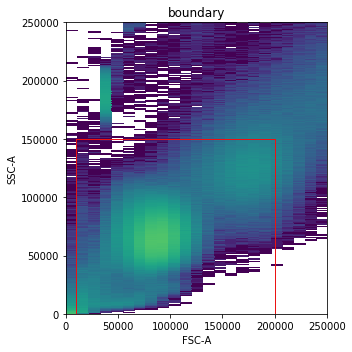

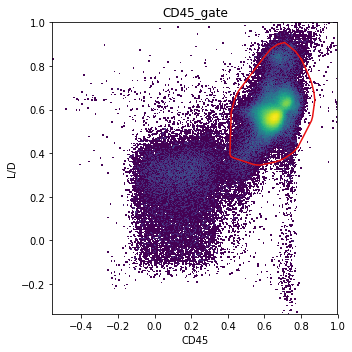

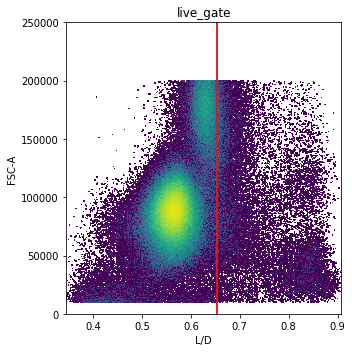

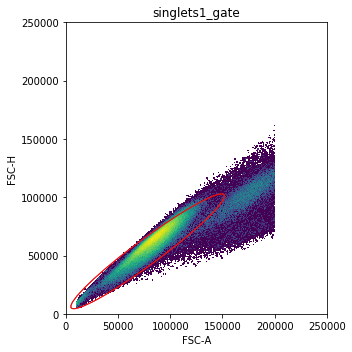

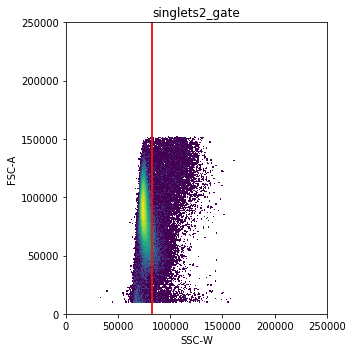

In [73]:
n = apply_template(samples[0], template='primary')

In [74]:
n.clean('Single_Live_CD45+')
n.save(overwrite=True)

Saved successfully!


True

<h3>209-05 INVALID</h3>

------------------ 209-05_pdmc_n ------------------
Applying boundary...
Applying live_gate...
Invalid parent; does not exist in current Gating object
Applying CD45_gate...
Applying singlets1_gate...
Invalid parent; does not exist in current Gating object
Applying singlets2_gate...
Invalid parent; does not exist in current Gating object
Complete!


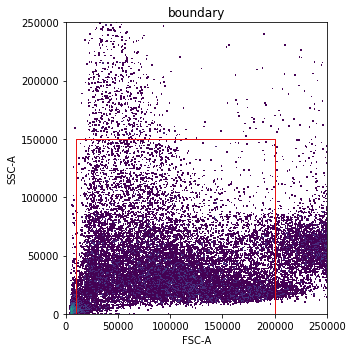

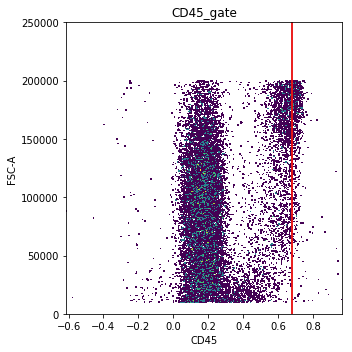

In [75]:
n = apply_template(samples[1])

In [12]:
n.clean('Single_Live_CD45+')
n.save(overwrite=True)

Saved successfully!


True

<h3>210-14</h3>

------------------ 210-14_pdmc_n ------------------
Applying boundary...
Applying CD45_gate...
Applying live_gate...
Applying singlets1_gate...
Applying singlets2_gate...
Complete!


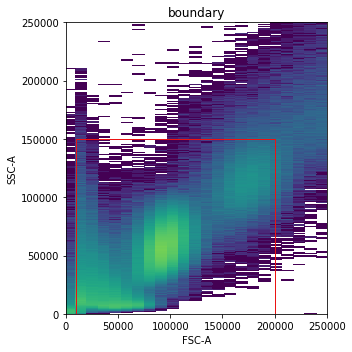

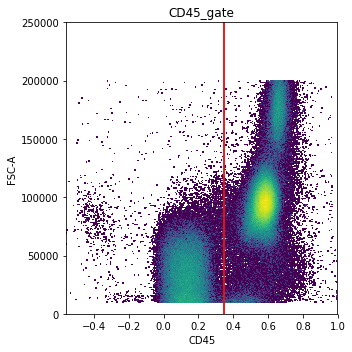

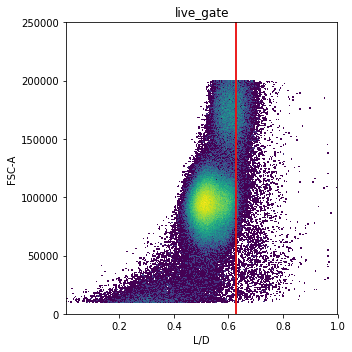

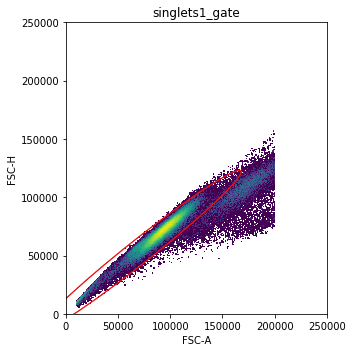

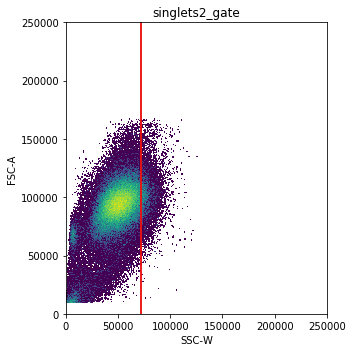

In [90]:
n = apply_template(samples[2])

In [91]:
n.clean('Single_Live_CD45+')
n.save(overwrite=True)

Saved successfully!


True

<h3>239-02</h3>

------------------ 239-02_pdmc_n ------------------
Applying boundary...
Applying CD45_gate...
Applying live_gate...
Applying singlets1_gate...
Applying singlets2_gate...
Complete!


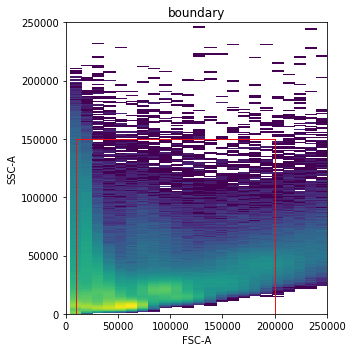

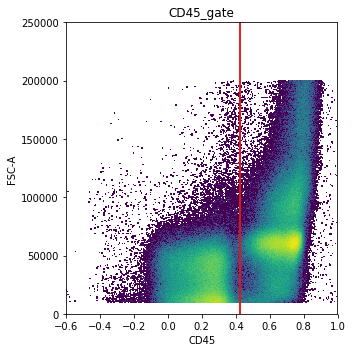

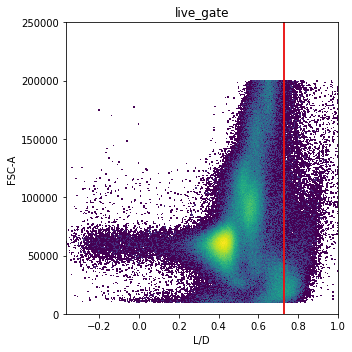

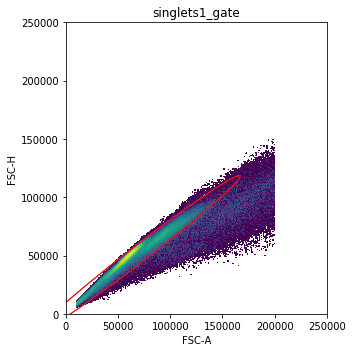

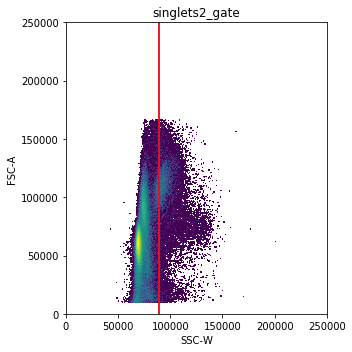

In [92]:
n = apply_template(samples[3])

In [93]:
n.clean('Single_Live_CD45+')
n.save(overwrite=True)

Saved successfully!


True

<h3>239-04</h3>

------------------ 239-04_pdmc_n ------------------
Applying boundary...
Applying CD45_gate...
Applying live_gate...
Applying singlets1_gate...
Applying singlets2_gate...
Complete!


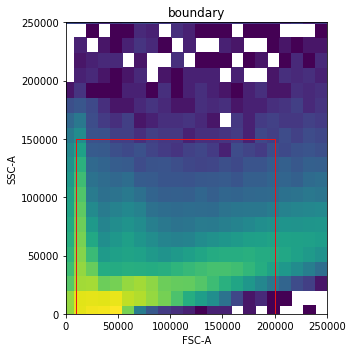

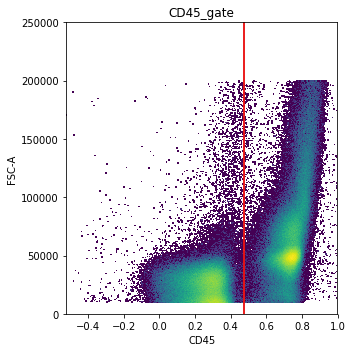

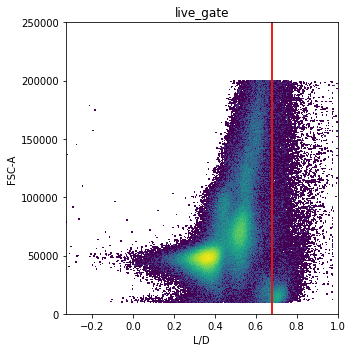

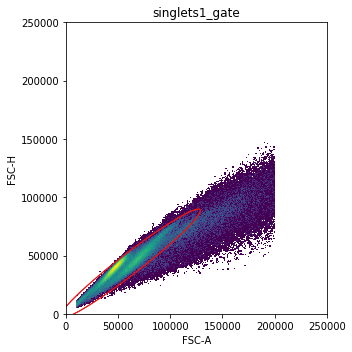

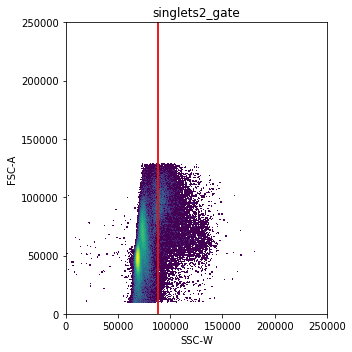

In [94]:
n = apply_template(samples[4])

In [95]:
n.clean('Single_Live_CD45+')
n.save(overwrite=True)

Saved successfully!


True

<h3>251-07</h3>

------------------ 251-07_pdmc_n ------------------
Applying boundary...
Applying CD45_gate...
Applying live_gate...
Applying singlets1_gate...
Applying singlets2_gate...
Complete!


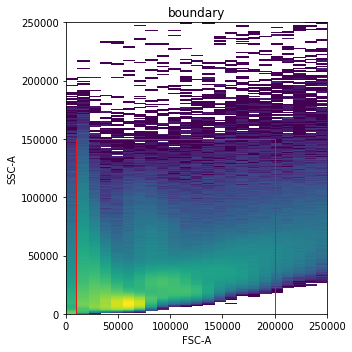

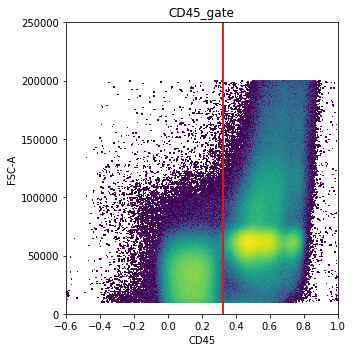

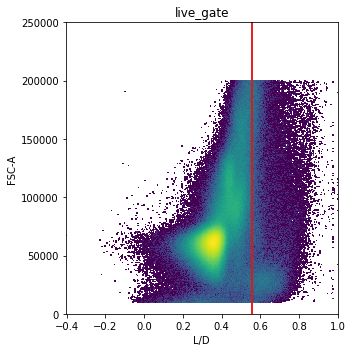

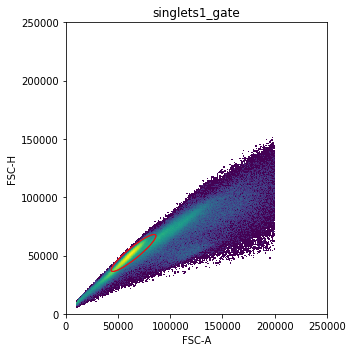

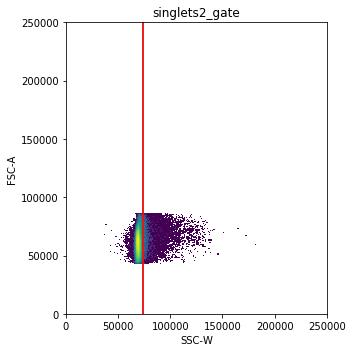

In [96]:
n = apply_template(samples[5])

In [97]:
n.remove_gate('singlets1_gate', propagate=True)

(['singlets2_gate', 'singlets1_gate'],
 ['singlets1',
  'doublets2',
  'Single_Live_CD45+',
  'singlets1',
  'doublets1',
  'doublets1'])

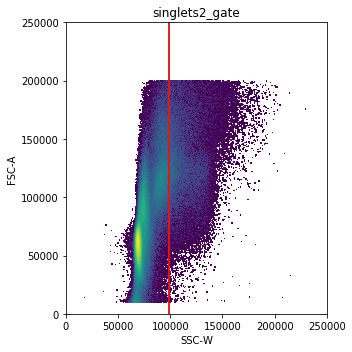

In [100]:
children = ChildPopulationCollection('threshold_1d')
children.add_population('doublets2', definition='+')
children.add_population('Single_Live_CD45+', definition='-')
kwargs = dict(x='SSC-W', transform_x=None, kde_bw=5000, low_memory=True,
             ignore_double_pos=False, peak_threshold=0.05)
n.create_gate(gate_name='singlets2_gate', 
              parent='Live_CD45+',
              class_='DensityThreshold',
              method='gate_1d',
              child_populations=children, 
              kwargs=kwargs)
n.apply('singlets2_gate')

In [101]:
n.clean('Single_Live_CD45+')
n.save(overwrite=True)

Saved successfully!


True

<h3>251-08</h3>

------------------ 251-08_pdmc_n ------------------
Applying boundary...
Applying CD45_gate...
Applying live_gate...
Applying singlets1_gate...
Applying singlets2_gate...
Complete!


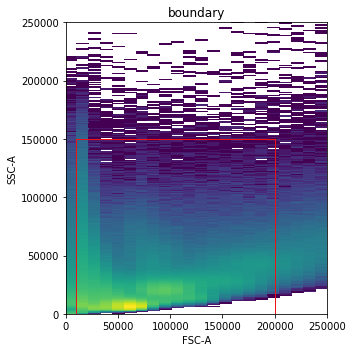

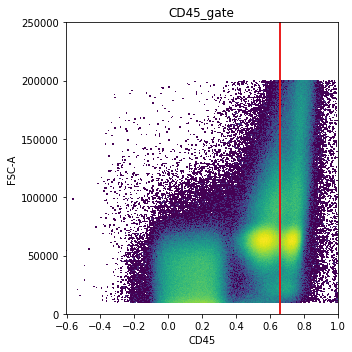

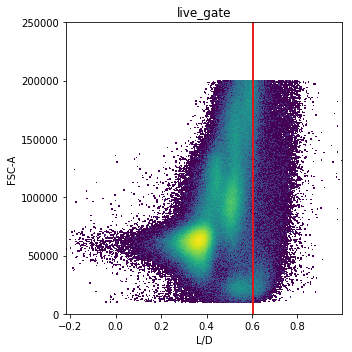

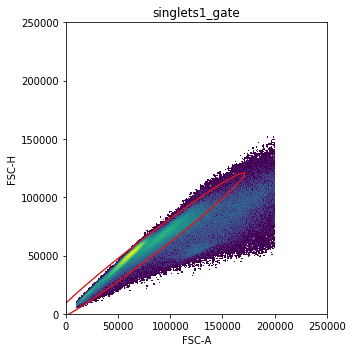

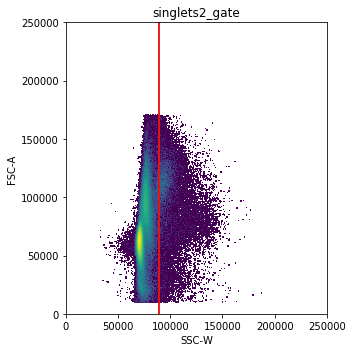

In [102]:
n = apply_template(samples[6])

In [103]:
n.clean('Single_Live_CD45+')
n.save(overwrite=True)

Saved successfully!


True

<h3>254-04</h3>

------------------ 254-04_pdmc_n ------------------
Applying boundary...
Applying CD45_gate...
Applying live_gate...
Applying singlets1_gate...
Applying singlets2_gate...
Complete!


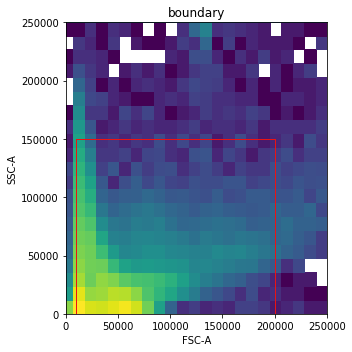

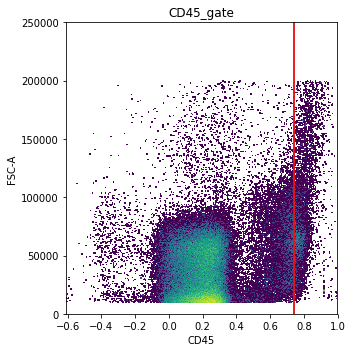

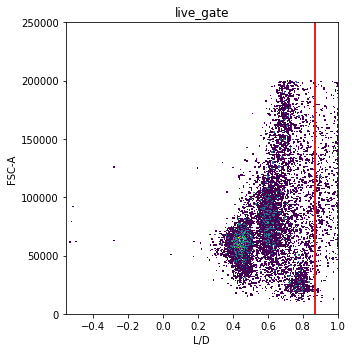

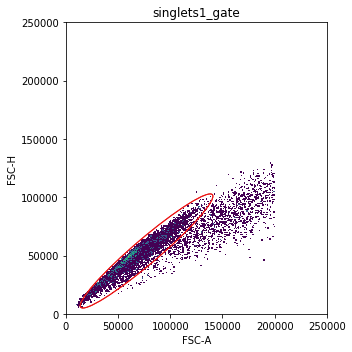

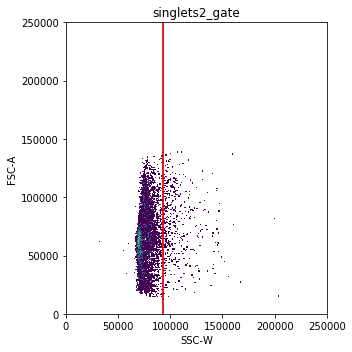

In [104]:
n = apply_template(samples[7])

In [130]:
n.remove_population('CD45+')
n.remove_population('CD45-')

In [131]:
n.print_population_tree()

root
├── cells
└── debris


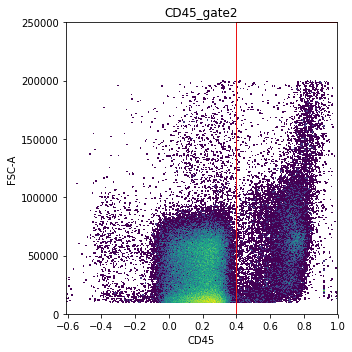

In [132]:
children = ChildPopulationCollection('geom')
children.add_population('CD45+', definition='+')
children.add_population('CD45-', definition='-')
kwargs = dict(x='CD45', y='FSC-A', transform_x='logicle', transform_y=None,
             x_min=0.4, y_min=0, x_max=1, y_max=250000)
n.create_gate(gate_name='CD45_gate2', 
              parent='cells',
              class_='Static',
              method='rect_gate',
              child_populations=children, 
              kwargs=kwargs)
n.apply('CD45_gate2')

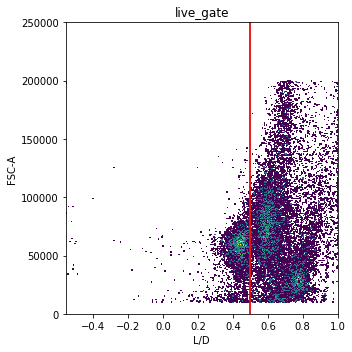

In [134]:
n.apply('live_gate')

In [135]:
n.remove_population('Live_CD45+')
n.remove_population('dead')

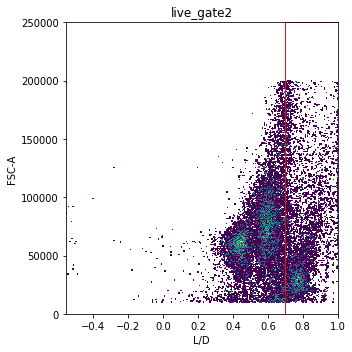

In [136]:
children = ChildPopulationCollection('geom')
children.add_population('Live_CD45+', definition='-')
children.add_population('dead', definition='+')
kwargs = dict(x='L/D', y='FSC-A', transform_x='logicle', transform_y=None,
             x_min=0.7, y_min=0, x_max=1, y_max=250000)
n.create_gate(gate_name='live_gate2', 
              parent='CD45+',
              class_='Static',
              method='rect_gate',
              child_populations=children, 
              kwargs=kwargs)
n.apply('live_gate2')

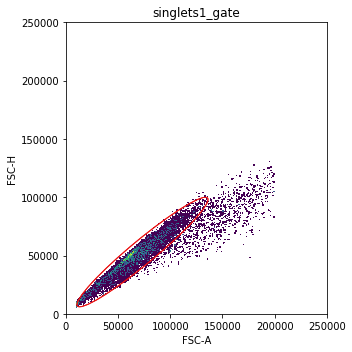

In [137]:
n.apply('singlets1_gate')

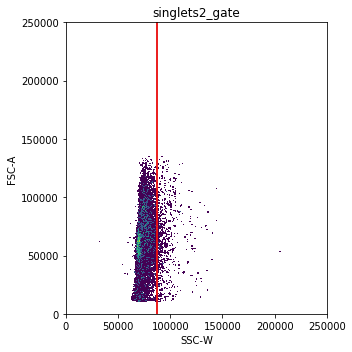

In [138]:
n.apply('singlets2_gate')

In [139]:
n.clean('Single_Live_CD45+')
n.save()

Saved successfully!


True

<h3>254-05</h3>

------------------ 254-05_pdmc_n ------------------
Applying boundary...
Applying CD45_gate...
Applying live_gate...
Applying singlets1_gate...
Applying singlets2_gate...
Complete!


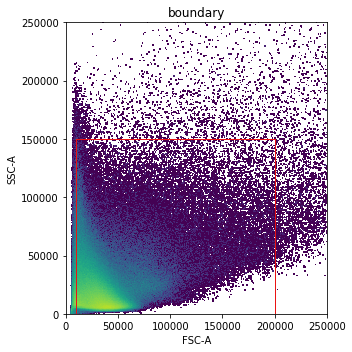

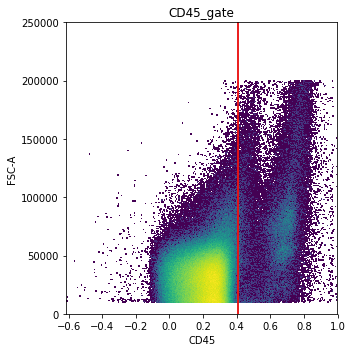

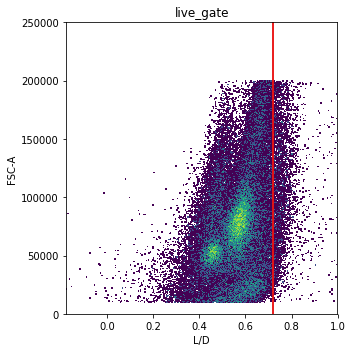

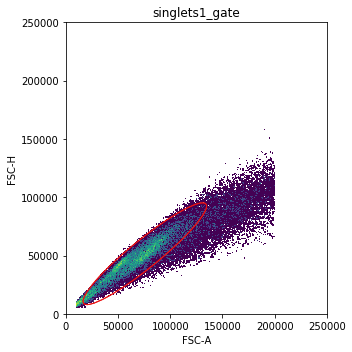

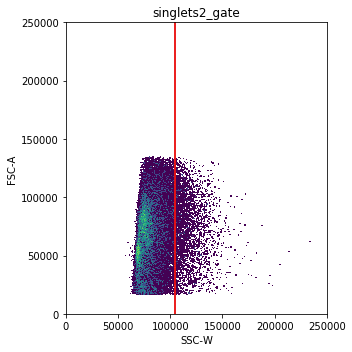

In [140]:
n = apply_template(samples[8])

In [141]:
n.clean('Single_Live_CD45+')
n.save()

Saved successfully!


True

<h3>255-04</h3>

------------------ 255-04_pdmc_n ------------------
Applying boundary...
Applying CD45_gate...
Applying live_gate...
Applying singlets1_gate...
Applying singlets2_gate...
Complete!


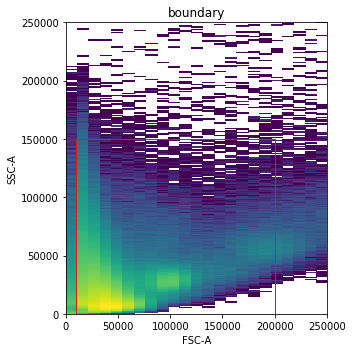

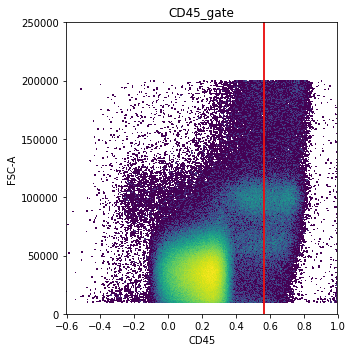

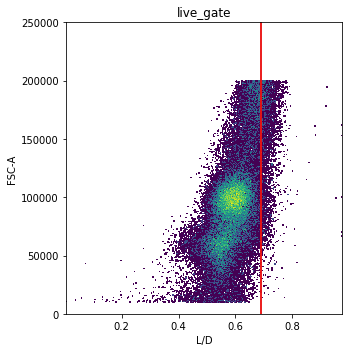

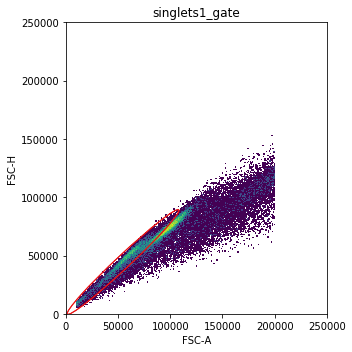

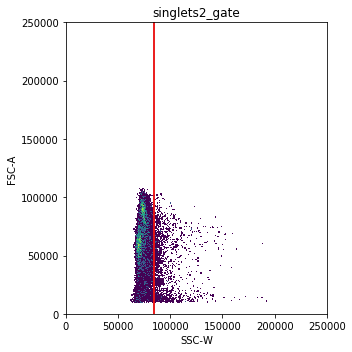

In [142]:
n = apply_template(samples[9])

In [143]:
n.remove_population('CD45+')
n.remove_population('CD45-')

In [144]:
n.print_population_tree()

root
├── cells
└── debris


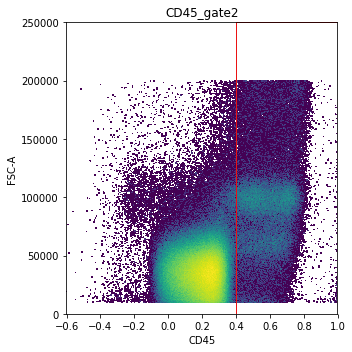

In [145]:
children = ChildPopulationCollection('geom')
children.add_population('CD45+', definition='+')
children.add_population('CD45-', definition='-')
kwargs = dict(x='CD45', y='FSC-A', transform_x='logicle', transform_y=None,
             x_min=0.4, y_min=0, x_max=1, y_max=250000)
n.create_gate(gate_name='CD45_gate2', 
              parent='cells',
              class_='Static',
              method='rect_gate',
              child_populations=children, 
              kwargs=kwargs)
n.apply('CD45_gate2')

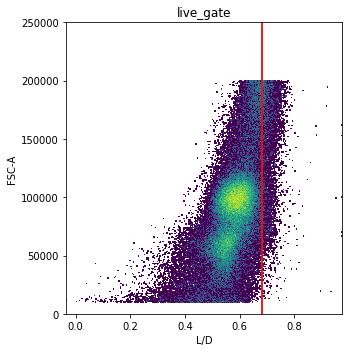

In [146]:
n.apply('live_gate')

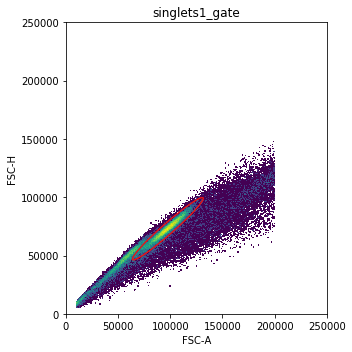

In [148]:
n.apply('singlets1_gate')

In [149]:
n.remove_population('singlets1')
n.remove_population('doublets1')

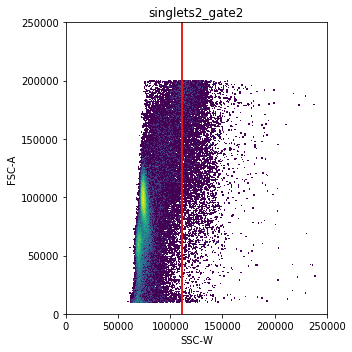

In [150]:
children = ChildPopulationCollection('threshold_1d')
children.add_population('doublets2', definition='+')
children.add_population('Single_Live_CD45+', definition='-')
kwargs = dict(x='SSC-W', transform_x=None, q=0.95)
n.create_gate(gate_name='singlets2_gate2', 
              parent='Live_CD45+',
              class_='Quantile',
              method='gate_1d',
              child_populations=children, 
              kwargs=kwargs)
n.apply('singlets2_gate2')

In [151]:
n.clean('Single_Live_CD45+')
n.save()

Saved successfully!


True

<h3>255-05</h3>

------------------ 255-05_pdmc_n ------------------
Applying boundary...
Applying CD45_gate...
Applying live_gate...
Applying singlets1_gate...
Applying singlets2_gate...
Complete!


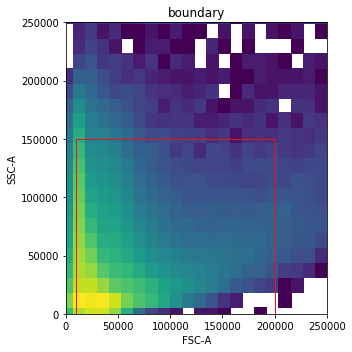

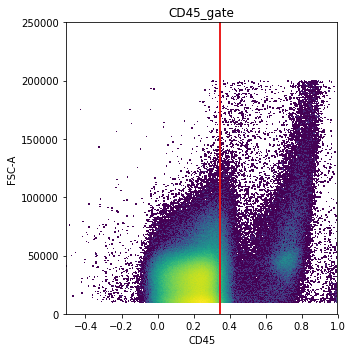

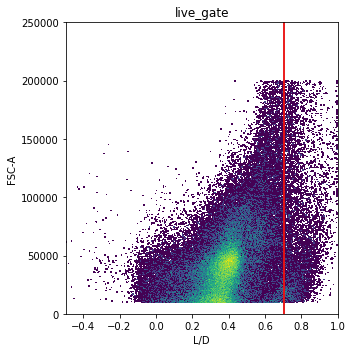

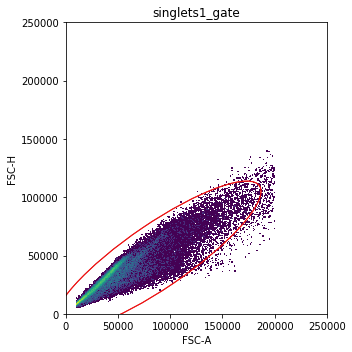

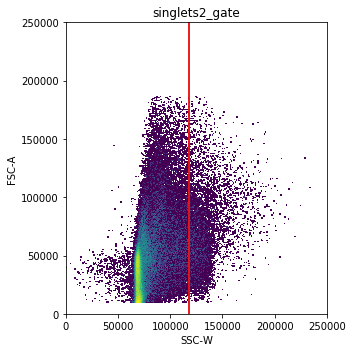

In [152]:
n = apply_template(samples[10])

In [153]:
n.clean('Single_Live_CD45+')
n.save()

Saved successfully!


True

<h3>264-02</h3>

------------------ 264-02_pdmc_n ------------------
Applying boundary...
Applying CD45_gate...
Applying live_gate...
Applying singlets1_gate...
Applying singlets2_gate...
Complete!


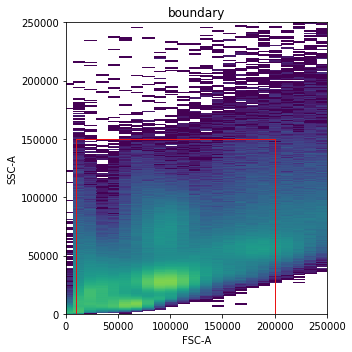

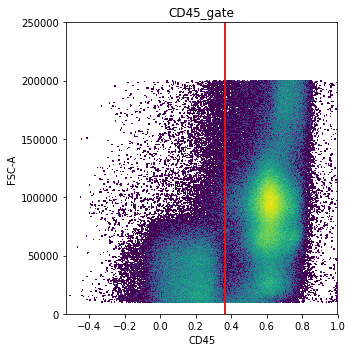

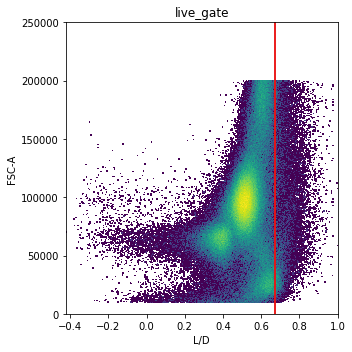

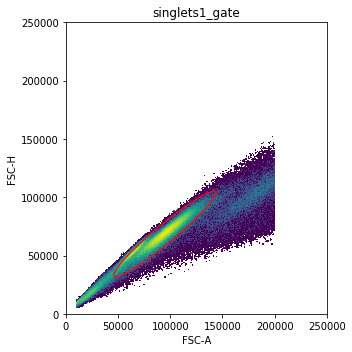

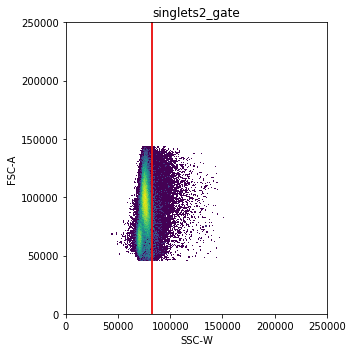

In [154]:
n = apply_template(samples[11], template='secondary')

In [155]:
n.clean('Single_Live_CD45+')
n.save(overwrite=True)

Saved successfully!


True

<h3>267-02</h3>

------------------ 267-02_pdmc_n ------------------
Applying boundary...
Applying CD45_gate...
Applying live_gate...
Applying singlets1_gate...
Applying singlets2_gate...
Complete!


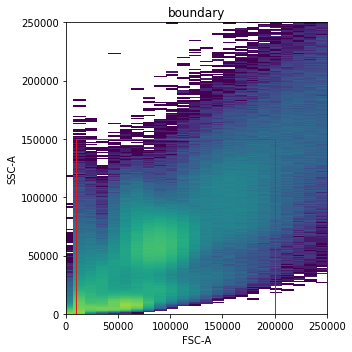

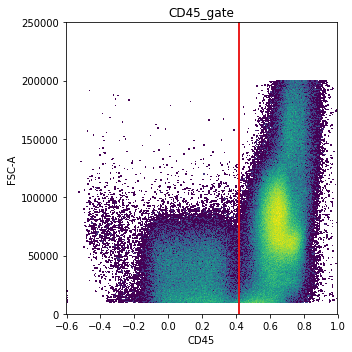

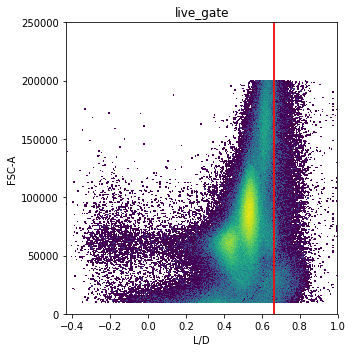

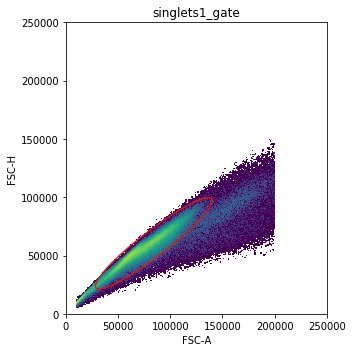

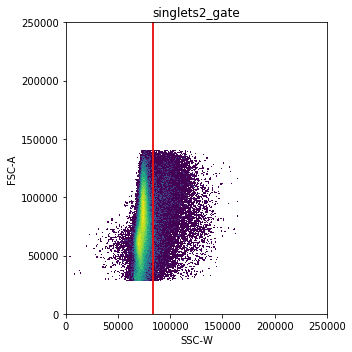

In [156]:
n = apply_template(samples[12], template='secondary')

In [157]:
n.clean('Single_Live_CD45+')
n.save(overwrite=True)

Saved successfully!


True

<h3>273-01</h3>

------------------ 273-01_pdmc_n ------------------
Applying boundary...
Applying CD45_gate...
Applying live_gate...
Applying singlets1_gate...
Applying singlets2_gate...
Complete!


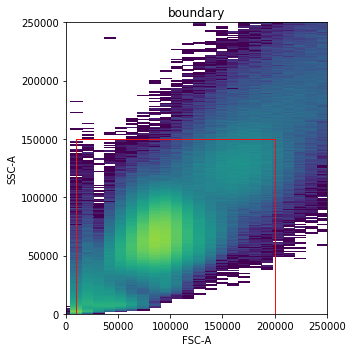

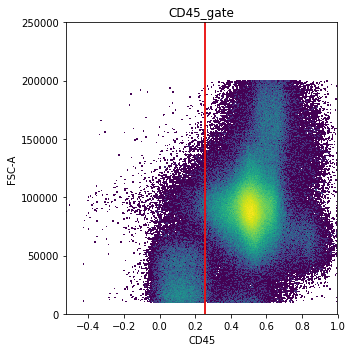

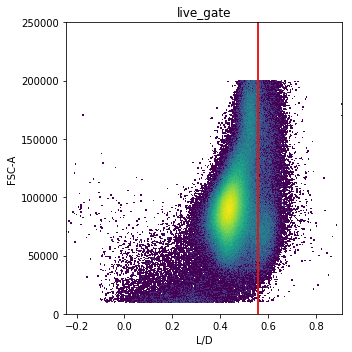

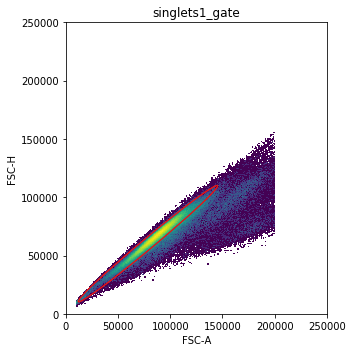

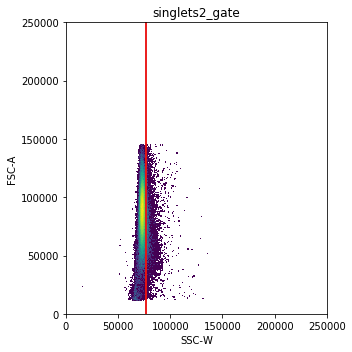

In [158]:
n = apply_template(samples[13])

In [159]:
n.clean('Single_Live_CD45+')
n.save(overwrite=True)

Saved successfully!


True

<h3>276-01</h3>

------------------ 276-01_pdmc_n ------------------
Applying boundary...
Applying CD45_gate...
Applying live_gate...
Applying singlets1_gate...
Applying singlets2_gate...
Complete!


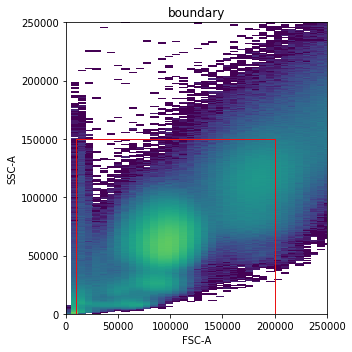

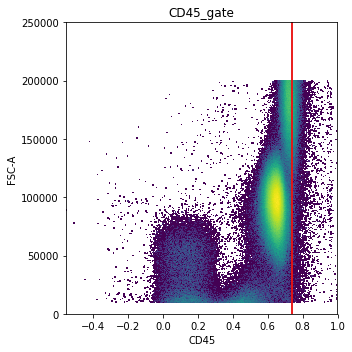

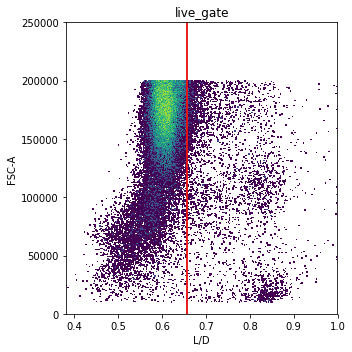

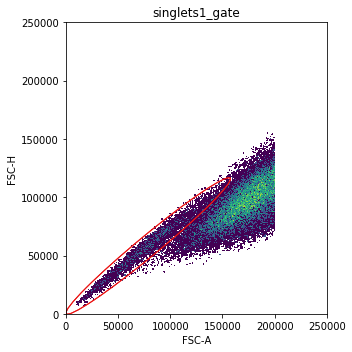

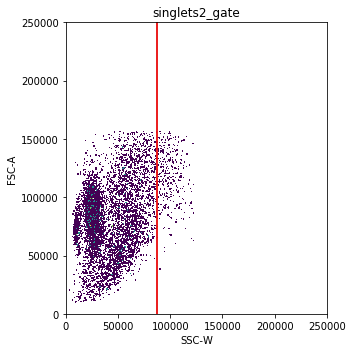

In [160]:
n = apply_template(samples[14])

In [161]:
n.remove_population('CD45+')
n.remove_population('CD45-')

In [162]:
n.print_population_tree()

root
├── cells
└── debris


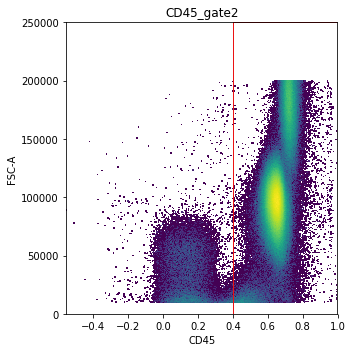

In [163]:
children = ChildPopulationCollection('geom')
children.add_population('CD45+', definition='+')
children.add_population('CD45-', definition='-')
kwargs = dict(x='CD45', y='FSC-A', transform_x='logicle', transform_y=None,
             x_min=0.4, y_min=0, x_max=1, y_max=250000)
n.create_gate(gate_name='CD45_gate2', 
              parent='cells',
              class_='Static',
              method='rect_gate',
              child_populations=children, 
              kwargs=kwargs)
n.apply('CD45_gate2')

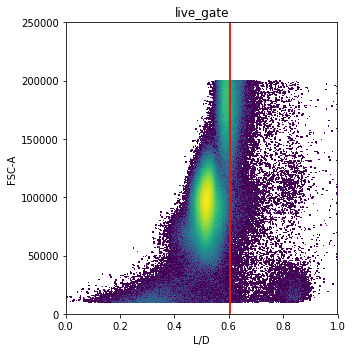

In [165]:
n.apply('live_gate')

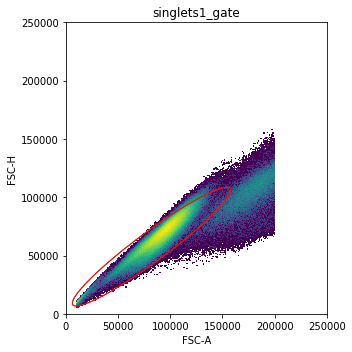

In [166]:
n.apply('singlets1_gate')

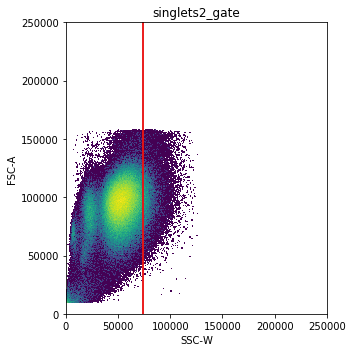

In [167]:
n.apply('singlets2_gate')

In [168]:
n.clean('Single_Live_CD45+')
n.save(overwrite=True)

Saved successfully!


True

<h3>286-03</h3>

------------------ 286-03_pdmc_n ------------------
Applying boundary...
Applying CD45_gate...
Applying live_gate...
Applying singlets1_gate...
Applying singlets2_gate...
Complete!


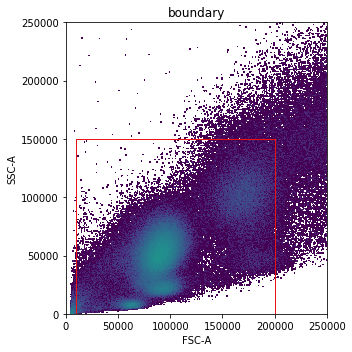

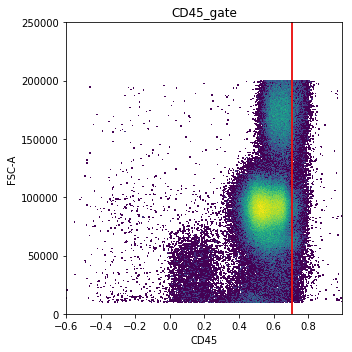

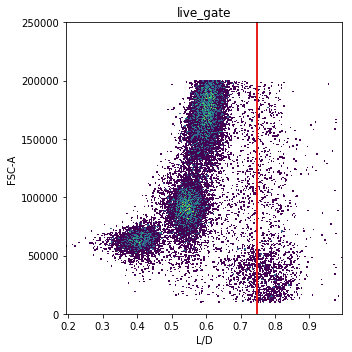

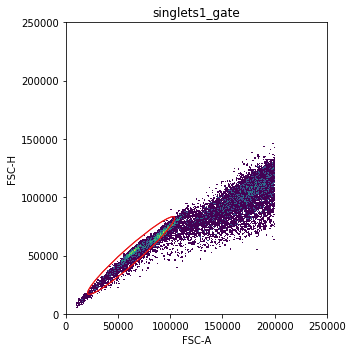

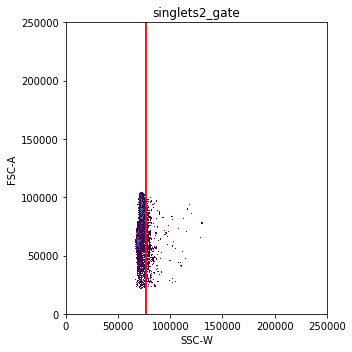

In [171]:
n = apply_template(samples[15])

In [172]:
n.remove_population('CD45+')
n.remove_population('CD45-')

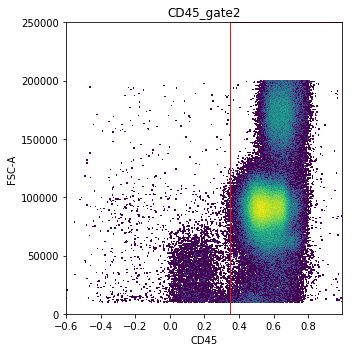

In [173]:
children = ChildPopulationCollection('geom')
children.add_population('CD45+', definition='+')
children.add_population('CD45-', definition='-')
kwargs = dict(x='CD45', y='FSC-A', transform_x='logicle', transform_y=None,
             x_min=0.35, y_min=0, x_max=1, y_max=250000)
n.create_gate(gate_name='CD45_gate2', 
              parent='cells',
              class_='Static',
              method='rect_gate',
              child_populations=children, 
              kwargs=kwargs)
n.apply('CD45_gate2')

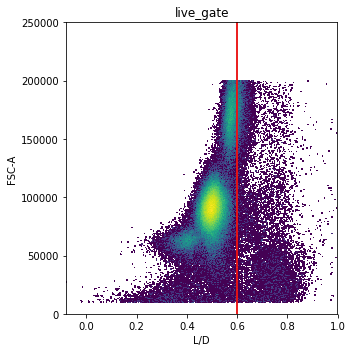

In [174]:
n.apply('live_gate')

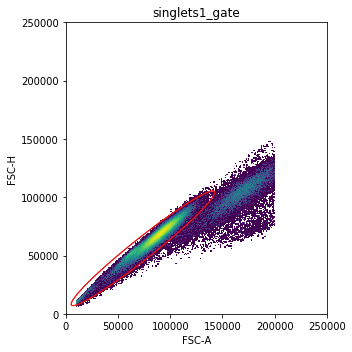

In [175]:
n.apply('singlets1_gate')

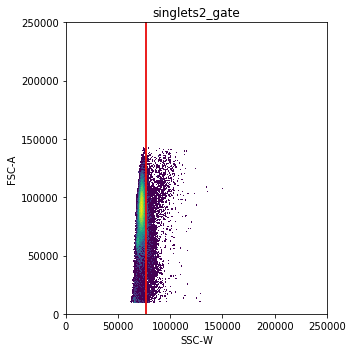

In [176]:
n.apply('singlets2_gate')

In [177]:
n.clean('Single_Live_CD45+')
n.save()

Saved successfully!


True

<h3>286-04</h3>

------------------ 286-04_pdmc_n ------------------
Applying boundary...
Applying CD45_gate...
Applying live_gate...
Applying singlets1_gate...
Applying singlets2_gate...
Complete!


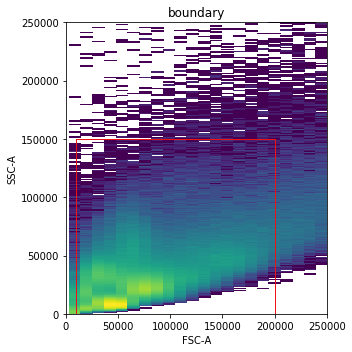

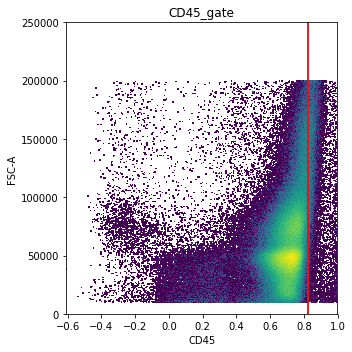

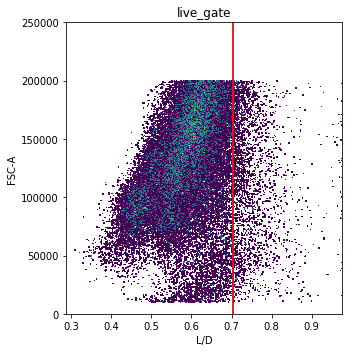

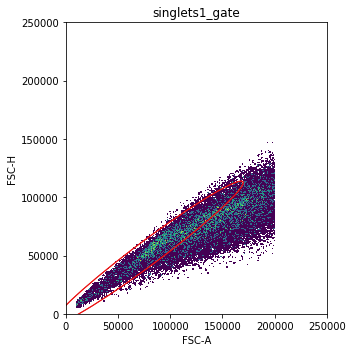

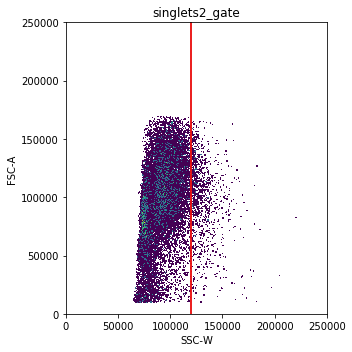

In [180]:
n = apply_template(samples[16])

In [181]:
n.remove_population('CD45+')
n.remove_population('CD45-')

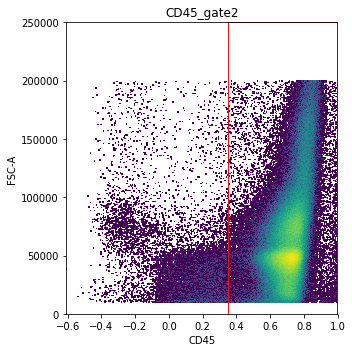

In [182]:
children = ChildPopulationCollection('geom')
children.add_population('CD45+', definition='+')
children.add_population('CD45-', definition='-')
kwargs = dict(x='CD45', y='FSC-A', transform_x='logicle', transform_y=None,
             x_min=0.35, y_min=0, x_max=1, y_max=250000)
n.create_gate(gate_name='CD45_gate2', 
              parent='cells',
              class_='Static',
              method='rect_gate',
              child_populations=children, 
              kwargs=kwargs)
n.apply('CD45_gate2')

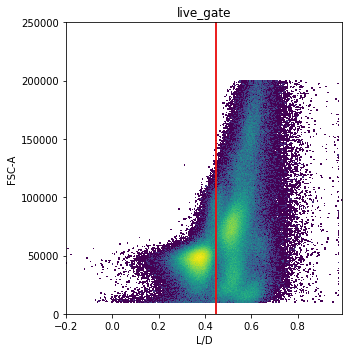

In [183]:
n.apply('live_gate')

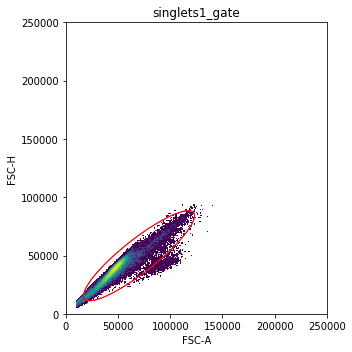

In [184]:
n.apply('singlets1_gate')

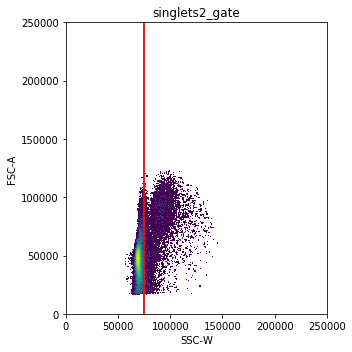

In [185]:
n.apply('singlets2_gate')

In [186]:
n.clean('Single_Live_CD45+')
n.save()

Saved successfully!


True

<h3>294-02</h3>

------------------ 294-02_pdmc_n ------------------
Applying boundary...
Applying CD45_gate...
Applying live_gate...
Applying singlets1_gate...
Applying singlets2_gate...
Complete!


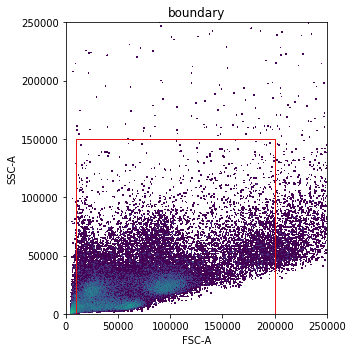

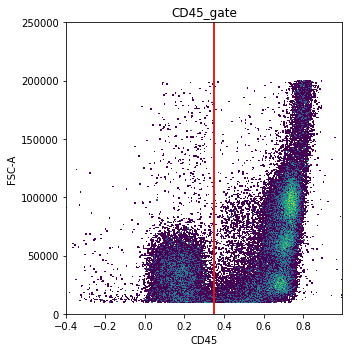

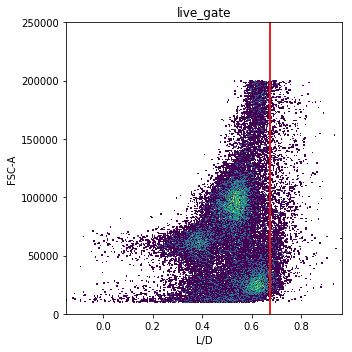

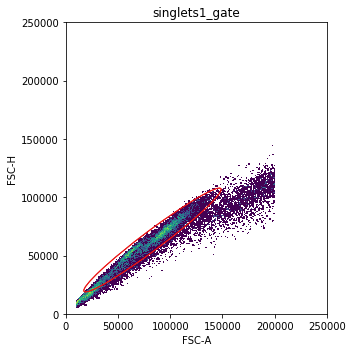

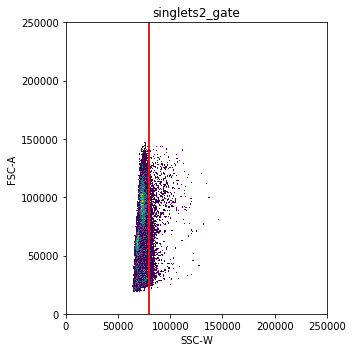

In [187]:
n = apply_template(samples[17])

In [188]:
n.clean('Single_Live_CD45+')
n.save()

Saved successfully!


True

<h3>294-03</h3>

------------------ 294-03_pdmc_n ------------------
Applying boundary...
Applying CD45_gate...
Applying live_gate...
Applying singlets1_gate...
Applying singlets2_gate...
Complete!


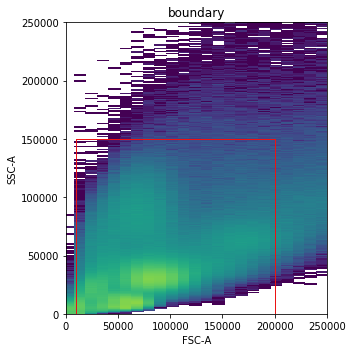

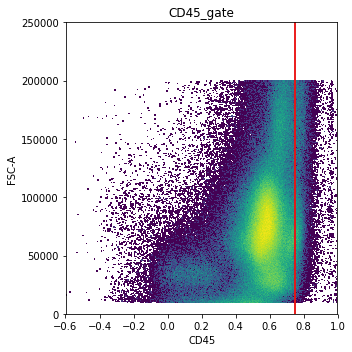

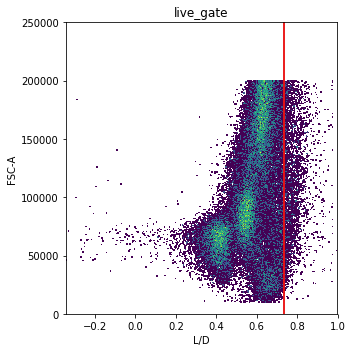

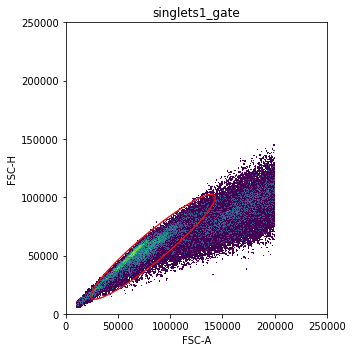

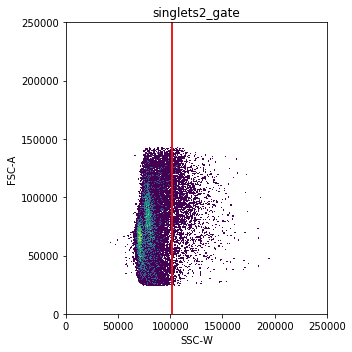

In [191]:
n = apply_template(samples[18])

In [192]:
n.remove_population('CD45+')
n.remove_population('CD45-')

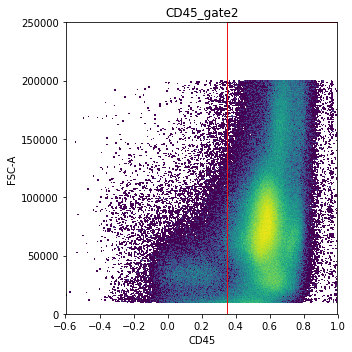

In [193]:
children = ChildPopulationCollection('geom')
children.add_population('CD45+', definition='+')
children.add_population('CD45-', definition='-')
kwargs = dict(x='CD45', y='FSC-A', transform_x='logicle', transform_y=None,
             x_min=0.35, y_min=0, x_max=1, y_max=250000)
n.create_gate(gate_name='CD45_gate2', 
              parent='cells',
              class_='Static',
              method='rect_gate',
              child_populations=children, 
              kwargs=kwargs)
n.apply('CD45_gate2')

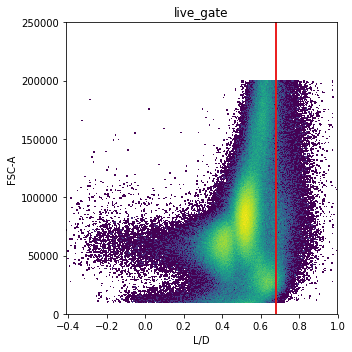

In [194]:
n.apply('live_gate')

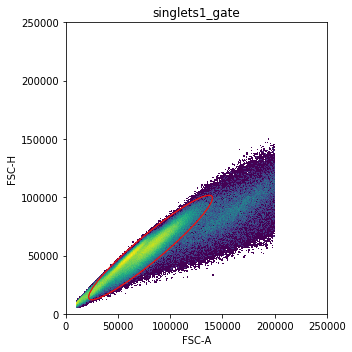

In [195]:
n.apply('singlets1_gate')

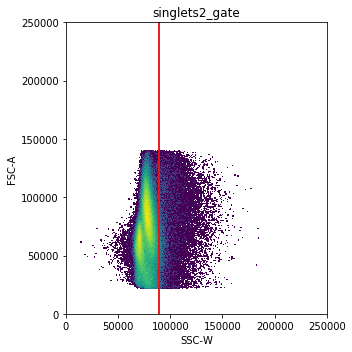

In [196]:
n.apply('singlets2_gate')

In [197]:
n.clean('Single_Live_CD45+')
n.save()

Saved successfully!


True

<h3>298-01</h3>

------------------ 298-01_pdmc_n ------------------
Applying boundary...
Applying CD45_gate...
Applying live_gate...
Applying singlets1_gate...
Applying singlets2_gate...
Complete!


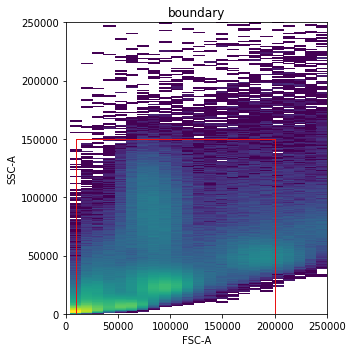

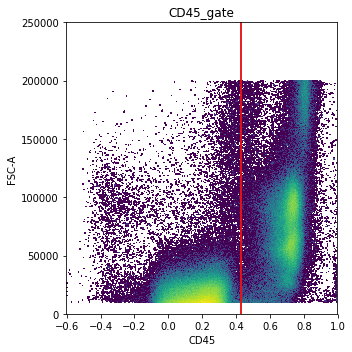

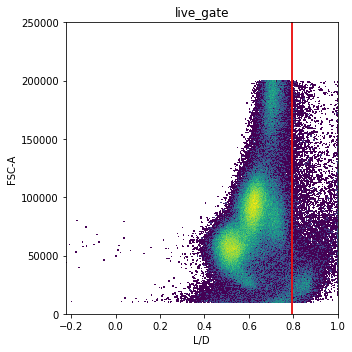

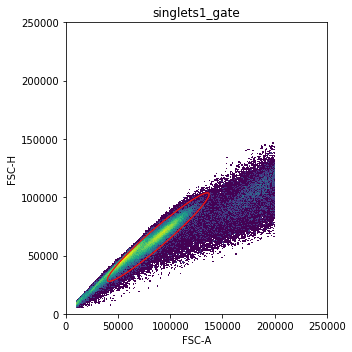

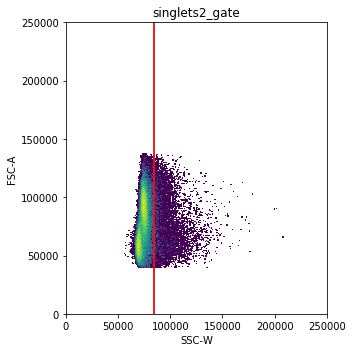

In [198]:
n = apply_template(samples[19])

In [199]:
n.clean('Single_Live_CD45+')
n.save()

Saved successfully!


True

<h3>305-01</h3>

------------------ 305-01_pdmc_n ------------------
Applying boundary...
Applying CD45_gate...
Applying live_gate...
Applying singlets1_gate...
Applying singlets2_gate...
Complete!


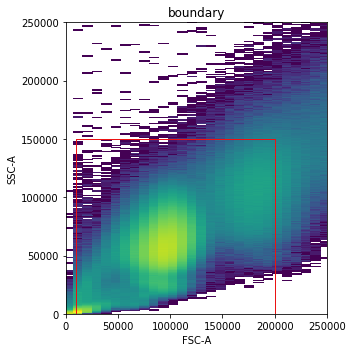

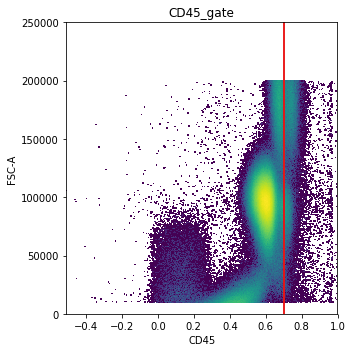

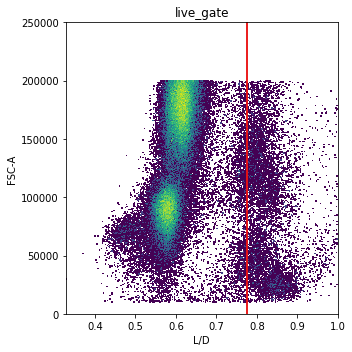

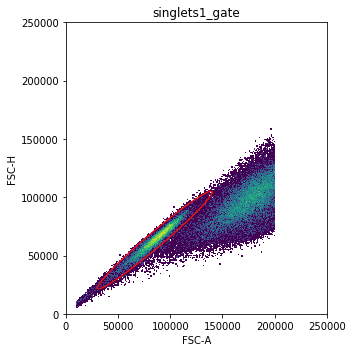

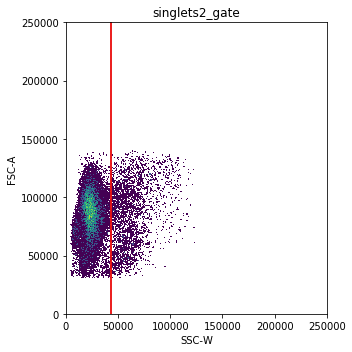

In [200]:
n = apply_template(samples[20])

In [201]:
n.remove_population('CD45+')
n.remove_population('CD45-')

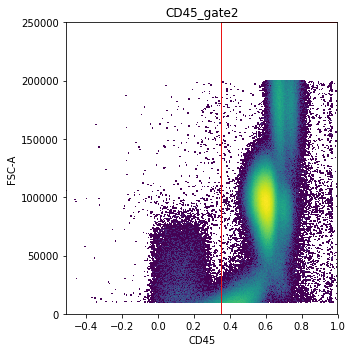

In [202]:
children = ChildPopulationCollection('geom')
children.add_population('CD45+', definition='+')
children.add_population('CD45-', definition='-')
kwargs = dict(x='CD45', y='FSC-A', transform_x='logicle', transform_y=None,
             x_min=0.35, y_min=0, x_max=1, y_max=250000)
n.create_gate(gate_name='CD45_gate2', 
              parent='cells',
              class_='Static',
              method='rect_gate',
              child_populations=children, 
              kwargs=kwargs)
n.apply('CD45_gate2')

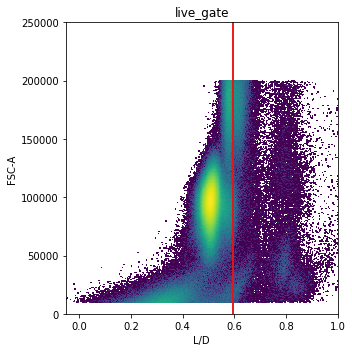

In [203]:
n.apply('live_gate')

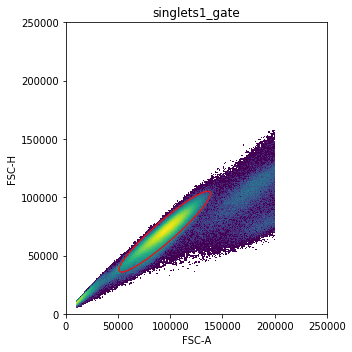

In [204]:
n.apply('singlets1_gate')

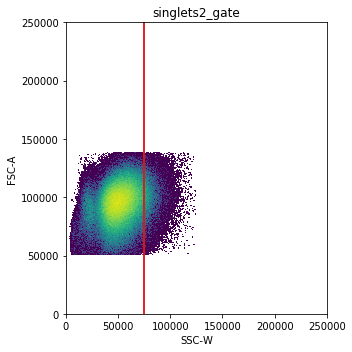

In [205]:
n.apply('singlets2_gate')

In [206]:
n.clean('Single_Live_CD45+')
n.save()

Saved successfully!


True

<h3>305-02</h3>

------------------ 305-02_pdmc_n ------------------
Applying boundary...
Applying CD45_gate...
Applying live_gate...
Applying singlets1_gate...
Applying singlets2_gate...
Complete!


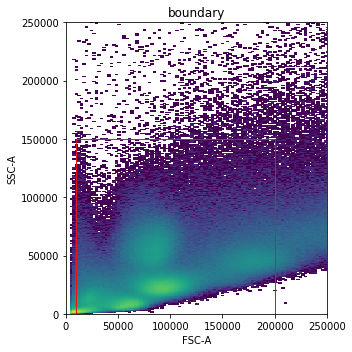

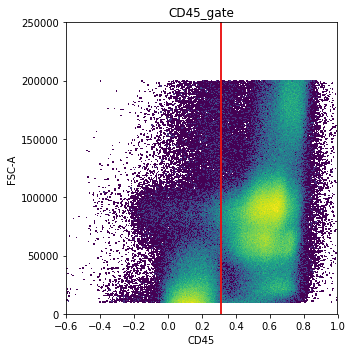

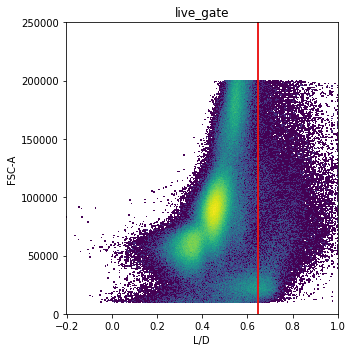

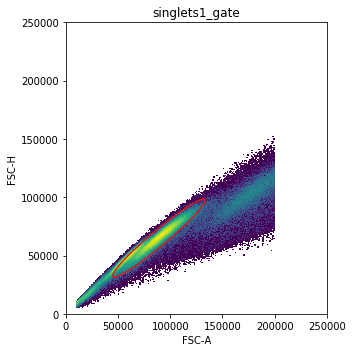

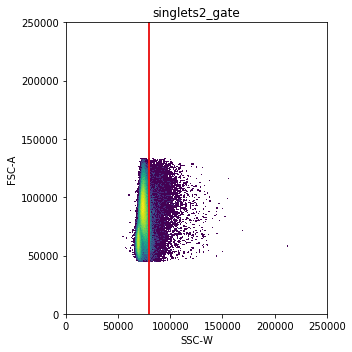

In [207]:
n = apply_template(samples[21])

In [208]:
n.clean('Single_Live_CD45+')
n.save()

Saved successfully!


True

<h3>305-03</h3>

------------------ 305-03_pdmc_n ------------------
Applying boundary...
Applying CD45_gate...
Applying live_gate...
Applying singlets1_gate...
Applying singlets2_gate...
Complete!


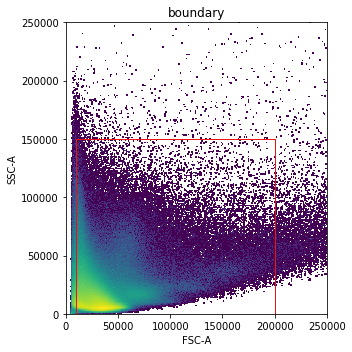

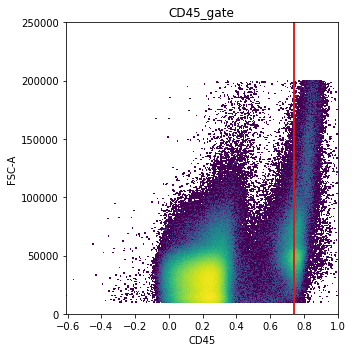

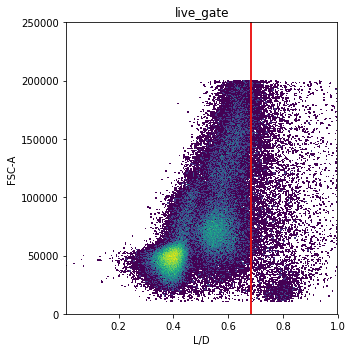

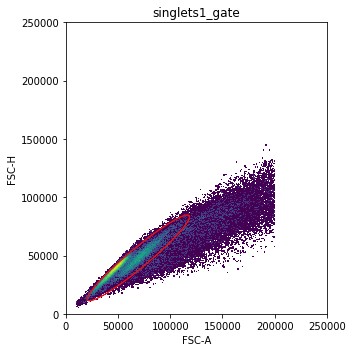

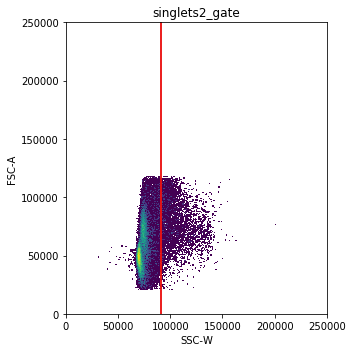

In [209]:
n = apply_template(samples[22])

In [210]:
n.remove_population('CD45+')
n.remove_population('CD45-')

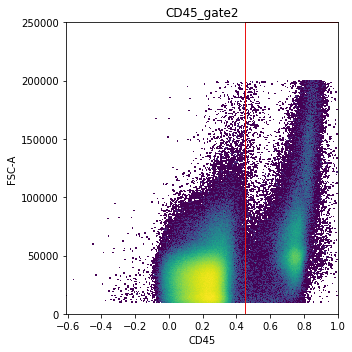

In [211]:
children = ChildPopulationCollection('geom')
children.add_population('CD45+', definition='+')
children.add_population('CD45-', definition='-')
kwargs = dict(x='CD45', y='FSC-A', transform_x='logicle', transform_y=None,
             x_min=0.45, y_min=0, x_max=1, y_max=250000)
n.create_gate(gate_name='CD45_gate2', 
              parent='cells',
              class_='Static',
              method='rect_gate',
              child_populations=children, 
              kwargs=kwargs)
n.apply('CD45_gate2')

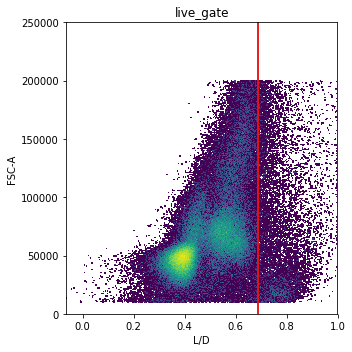

In [212]:
n.apply('live_gate')

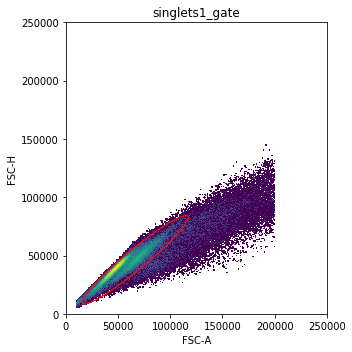

In [213]:
n.apply('singlets1_gate')

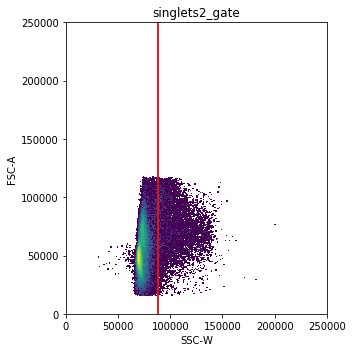

In [214]:
n.apply('singlets2_gate')

In [215]:
n.clean('Single_Live_CD45+')
n.save()

Saved successfully!


True

<h3>306-01</h3>

------------------ 306-01_pdmc_n ------------------
Applying boundary...
Applying CD45_gate...
Applying live_gate...
Applying singlets1_gate...
Applying singlets2_gate...
Complete!


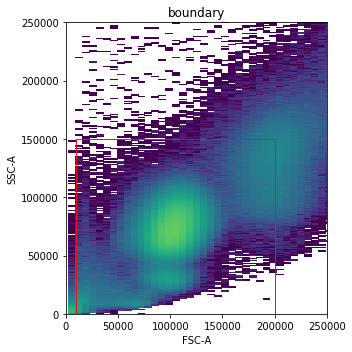

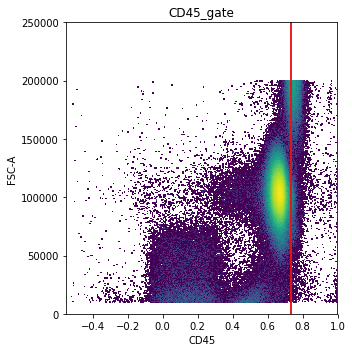

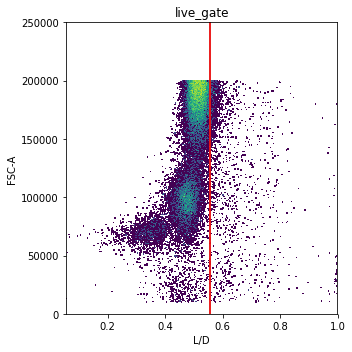

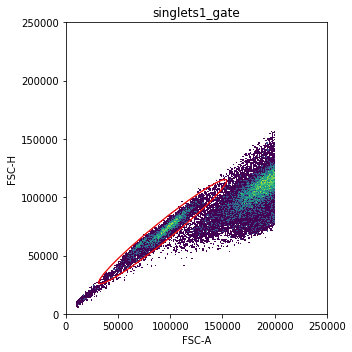

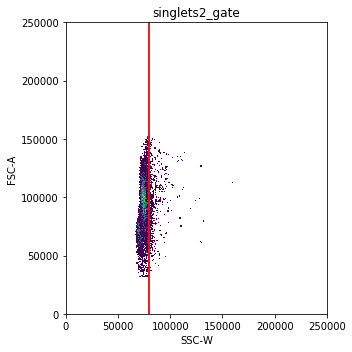

In [220]:
n = apply_template(samples[23])

In [221]:
n.remove_population('CD45+')
n.remove_population('CD45-')

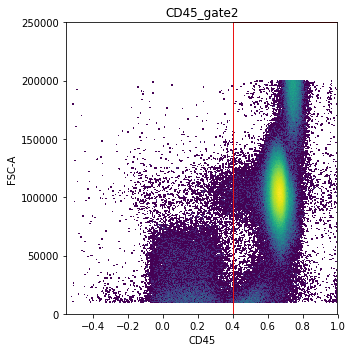

In [222]:
children = ChildPopulationCollection('geom')
children.add_population('CD45+', definition='+')
children.add_population('CD45-', definition='-')
kwargs = dict(x='CD45', y='FSC-A', transform_x='logicle', transform_y=None,
             x_min=0.4, y_min=0, x_max=1, y_max=250000)
n.create_gate(gate_name='CD45_gate2', 
              parent='cells',
              class_='Static',
              method='rect_gate',
              child_populations=children, 
              kwargs=kwargs)
n.apply('CD45_gate2')

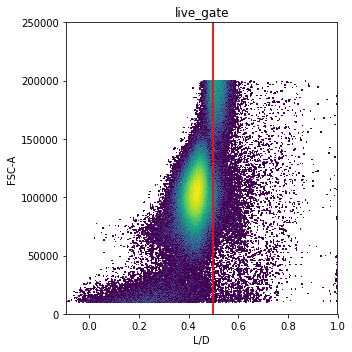

In [223]:
n.apply('live_gate')

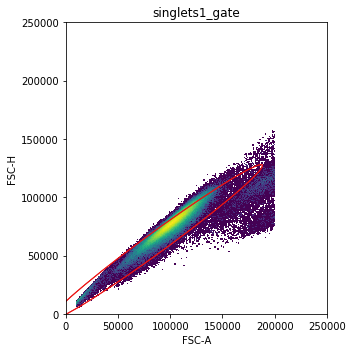

In [224]:
n.apply('singlets1_gate')

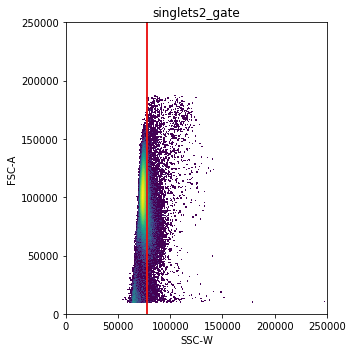

In [225]:
n.apply('singlets2_gate')

In [226]:
n.clean('Single_Live_CD45+')
n.save()

Saved successfully!


True

<h3>308-01</h3>

In [282]:
n = apply_template(samples[24])

------------------ 308-01_pdmc_n ------------------
User has chosen to apply all gates on a file with existing populations, when using the `apply_all` command files should have no existing populations. Remove existing populations from file before continuing. Aborting.


In [283]:
n.remove_population('cells')
n.remove_population('debris')

In [284]:
n.print_population_tree()

root


Applying boundary...
Applying CD45_gate...
Applying live_gate...
Applying singlets1_gate...
Applying singlets2_gate...
Applying CD45_gate2...
Error: population CD45+ already exists, if you wish to overwrite this population please remove it with the remove_population method and then try again
Applying singlets2_gate2...
Error: population doublets1 already exists, if you wish to overwrite this population please remove it with the remove_population method and then try again
Complete!


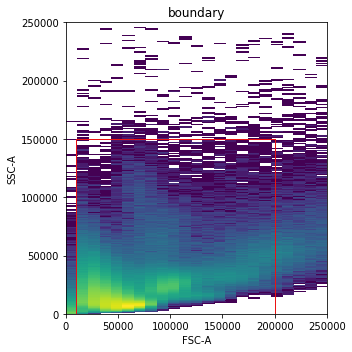

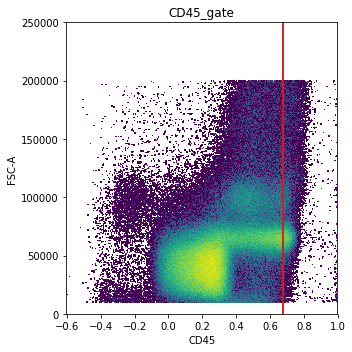

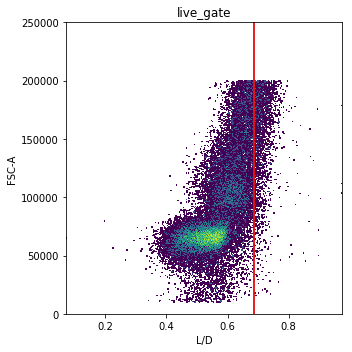

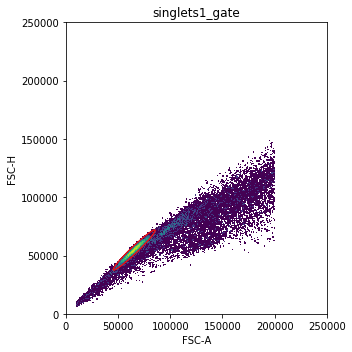

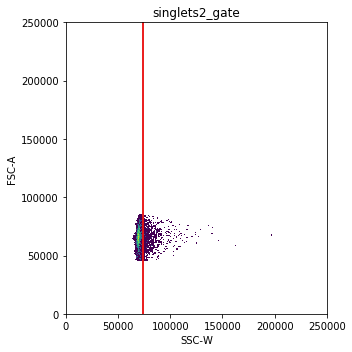

In [285]:
n.apply_many(apply_all=True, plot_outcome=True)

In [286]:
n.remove_population('CD45+')
n.remove_population('CD45-')

In [287]:
n.print_population_tree()

root
├── cells
└── debris


Error: gate with name CD45_gate2 already exists.


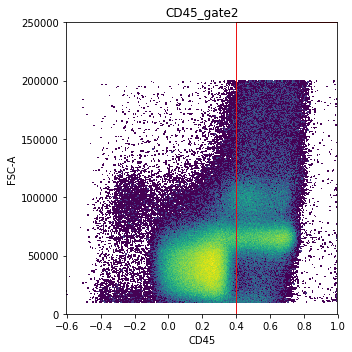

In [288]:
children = ChildPopulationCollection('geom')
children.add_population('CD45+', definition='+')
children.add_population('CD45-', definition='-')
kwargs = dict(x='CD45', y='FSC-A', transform_x='logicle', transform_y=None,
             x_min=0.4, y_min=0, x_max=1, y_max=250000)
n.create_gate(gate_name='CD45_gate2', 
              parent='cells',
              class_='Static',
              method='rect_gate',
              child_populations=children, 
              kwargs=kwargs)
n.apply('CD45_gate2')

In [289]:
n.print_population_tree()

root
├── cells
│   ├── CD45+
│   └── CD45-
└── debris


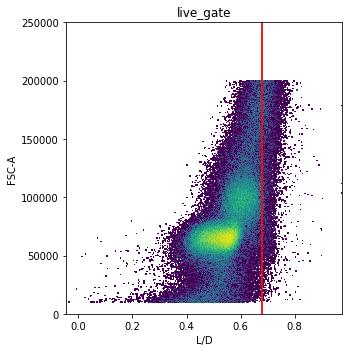

In [290]:
n.apply('live_gate')

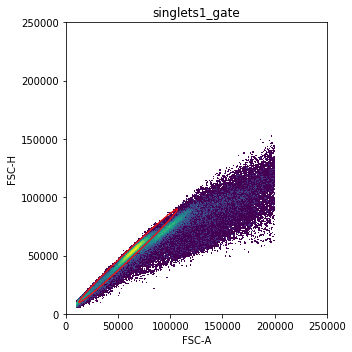

In [291]:
n.apply('singlets1_gate')

In [292]:
n.print_population_tree()

root
├── cells
│   ├── CD45+
│   │   ├── dead
│   │   └── Live_CD45+
│   │       ├── singlets1
│   │       └── doublets1
│   └── CD45-
└── debris


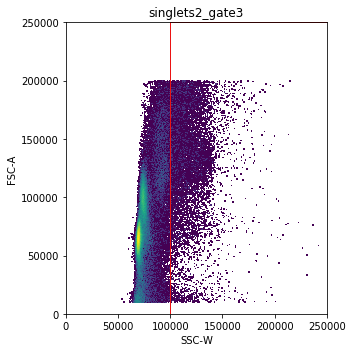

In [293]:
children = ChildPopulationCollection('geom')
children.add_population('doublets2', definition='+')
children.add_population('Single_Live_CD45+', definition='-')
kwargs = dict(x='SSC-W', y='FSC-A', transform_x=None, transform_y=None,
             x_min=100000, y_min=0, x_max=250000, y_max=250000)
n.create_gate(gate_name='singlets2_gate3', 
              parent='Live_CD45+',
              class_='Static',
              method='rect_gate',
              child_populations=children, 
              kwargs=kwargs)
n.apply('singlets2_gate3')

In [295]:
len(n.populations['Single_Live_CD45+'].index)

284626

In [296]:
n.clean('Single_Live_CD45+')]
n.save()

Population cache for fcs file 308-01_pdmc_n already exists, if you wish to overwritethis cache then specify overwrite as True


False

In [297]:
n.save(overwrite=True)

Saved successfully!


True

<h3>308-02R</h3>

------------------ 308-02R_pdmc_n ------------------
Applying boundary...
Applying CD45_gate...
Applying live_gate...
Applying singlets1_gate...
Applying singlets2_gate...
Complete!


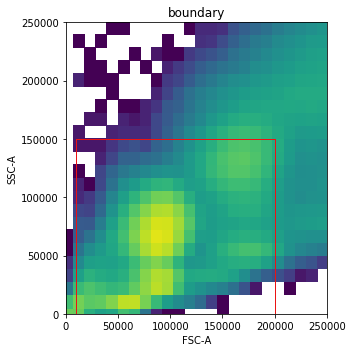

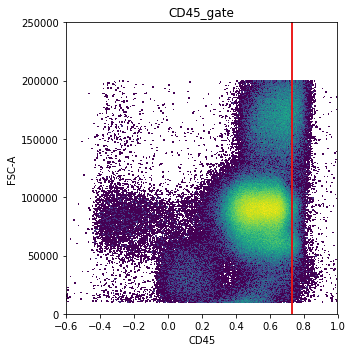

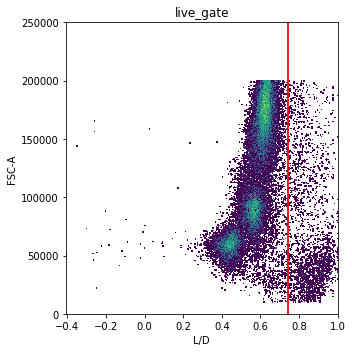

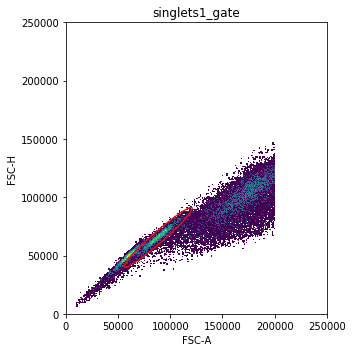

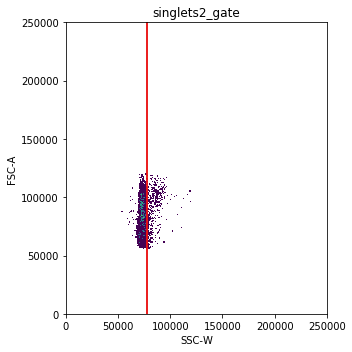

In [245]:
n = apply_template(samples[25])

In [246]:
n.remove_population('CD45+')
n.remove_population('CD45-')

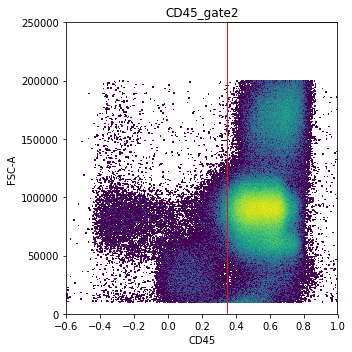

In [247]:
children = ChildPopulationCollection('geom')
children.add_population('CD45+', definition='+')
children.add_population('CD45-', definition='-')
kwargs = dict(x='CD45', y='FSC-A', transform_x='logicle', transform_y=None,
             x_min=0.35, y_min=0, x_max=1, y_max=250000)
n.create_gate(gate_name='CD45_gate2', 
              parent='cells',
              class_='Static',
              method='rect_gate',
              child_populations=children, 
              kwargs=kwargs)
n.apply('CD45_gate2')

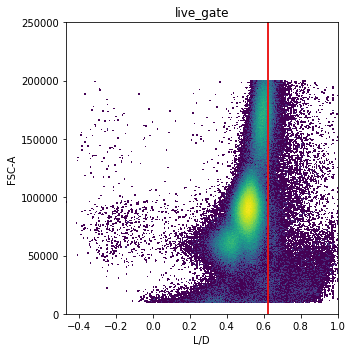

In [248]:
n.apply('live_gate')

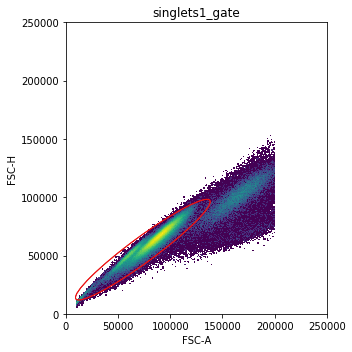

In [249]:
n.apply('singlets1_gate')

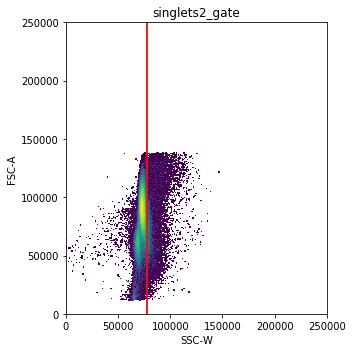

In [250]:
n.apply('singlets2_gate')

In [251]:
n.clean('Single_Live_CD45+')
n.save()

Saved successfully!


True

<h3>308-03R</h3>

------------------ 308-03R_pdmc_n ------------------
Applying boundary...
Applying CD45_gate...
Applying live_gate...
Applying singlets1_gate...
Applying singlets2_gate...
Complete!


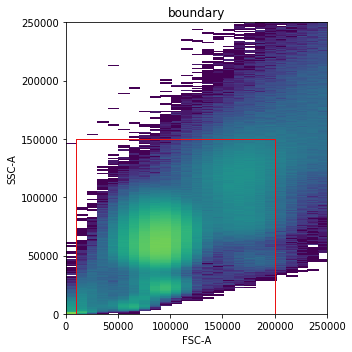

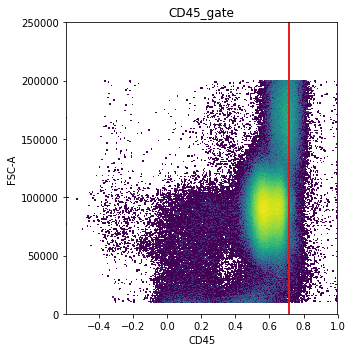

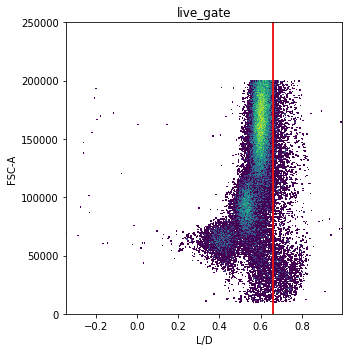

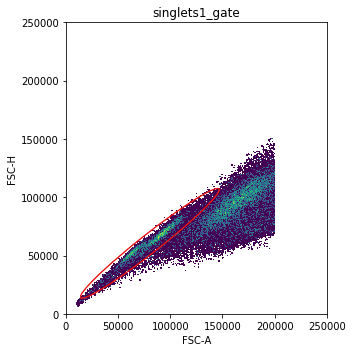

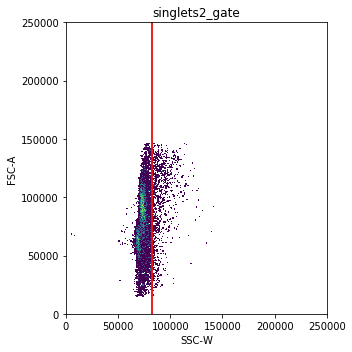

In [252]:
n = apply_template(samples[26])

In [253]:
n.remove_population('CD45+')
n.remove_population('CD45-')

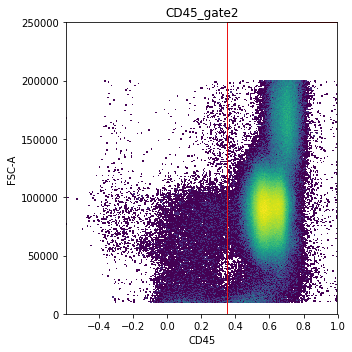

In [254]:
children = ChildPopulationCollection('geom')
children.add_population('CD45+', definition='+')
children.add_population('CD45-', definition='-')
kwargs = dict(x='CD45', y='FSC-A', transform_x='logicle', transform_y=None,
             x_min=0.35, y_min=0, x_max=1, y_max=250000)
n.create_gate(gate_name='CD45_gate2', 
              parent='cells',
              class_='Static',
              method='rect_gate',
              child_populations=children, 
              kwargs=kwargs)
n.apply('CD45_gate2')

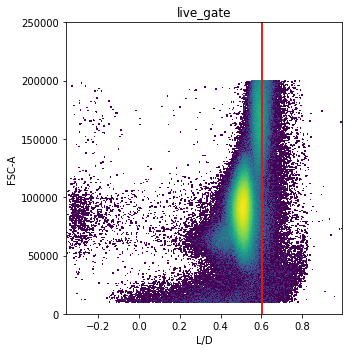

In [255]:
n.apply('live_gate')

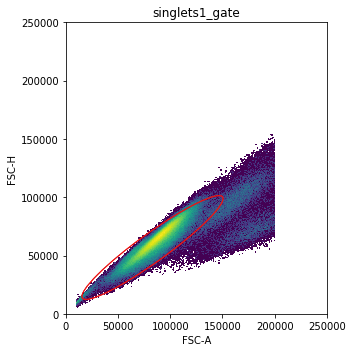

In [256]:
n.apply('singlets1_gate')

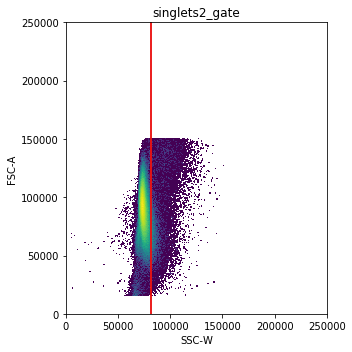

In [257]:
n.apply('singlets2_gate')

In [258]:
n.clean('Single_Live_CD45+')
n.save()

Saved successfully!


True

<h3>310-01</h3>

------------------ 310-01_pdmc_n ------------------
Applying boundary...
Applying CD45_gate...
Applying live_gate...
Applying singlets1_gate...
Applying singlets2_gate...
Complete!


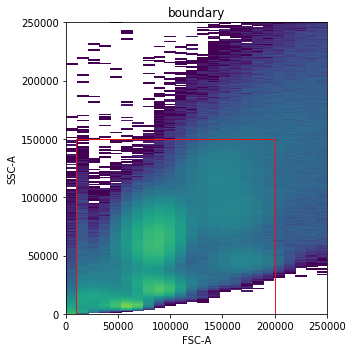

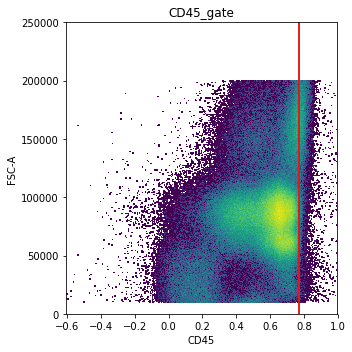

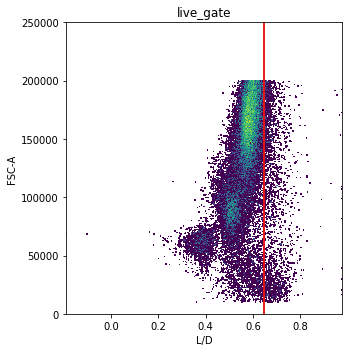

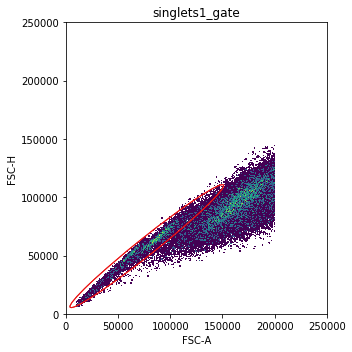

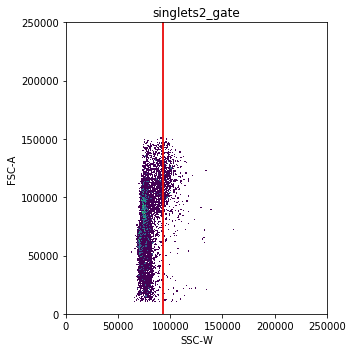

In [298]:
n = apply_template(samples[27])

In [299]:
n.remove_population('CD45+')
n.remove_population('CD45-')

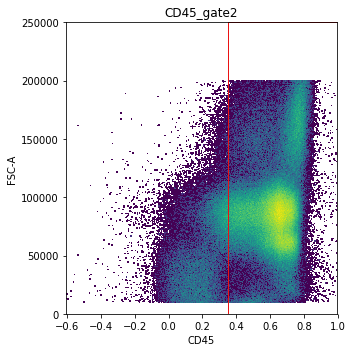

In [300]:
children = ChildPopulationCollection('geom')
children.add_population('CD45+', definition='+')
children.add_population('CD45-', definition='-')
kwargs = dict(x='CD45', y='FSC-A', transform_x='logicle', transform_y=None,
             x_min=0.35, y_min=0, x_max=1, y_max=250000)
n.create_gate(gate_name='CD45_gate2', 
              parent='cells',
              class_='Static',
              method='rect_gate',
              child_populations=children, 
              kwargs=kwargs)
n.apply('CD45_gate2')

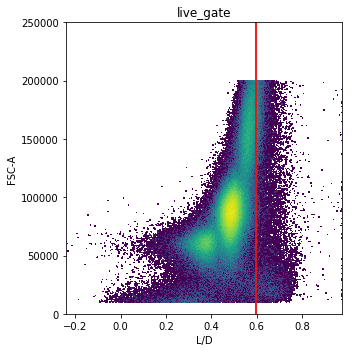

In [301]:
n.apply('live_gate')

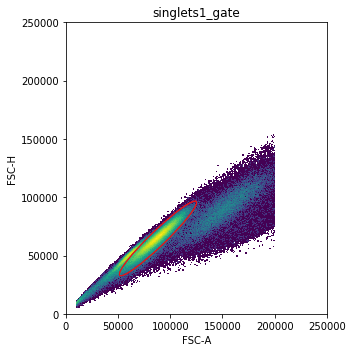

In [302]:
n.apply('singlets1_gate')

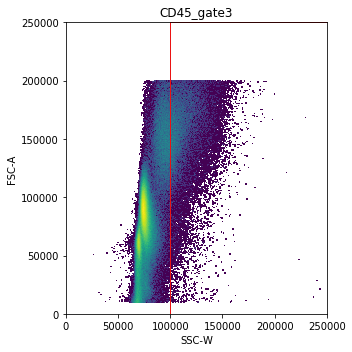

In [304]:
children = ChildPopulationCollection('geom')
children.add_population('doublets2', definition='+')
children.add_population('Single_Live_CD45+', definition='-')
kwargs = dict(x='SSC-W', y='FSC-A', transform_x=None, transform_y=None,
             x_min=100000, y_min=0, x_max=250000, y_max=250000)
n.create_gate(gate_name='CD45_gate3', 
              parent='cells',
              class_='Static',
              method='rect_gate',
              child_populations=children, 
              kwargs=kwargs)
n.apply('CD45_gate3')

In [305]:
n.clean('Single_Live_CD45+')
n.save()

Saved successfully!


True

<h3>315-01</h3>

------------------ 315-01_pdmc_n ------------------
Applying boundary...
Applying CD45_gate...
Applying live_gate...
Applying singlets1_gate...
Applying singlets2_gate...
Complete!


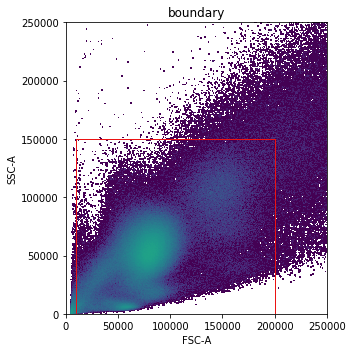

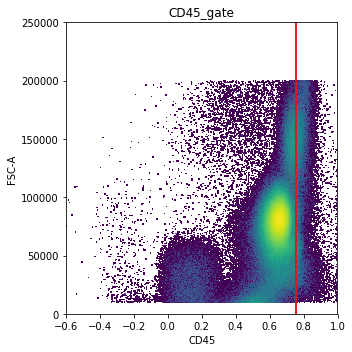

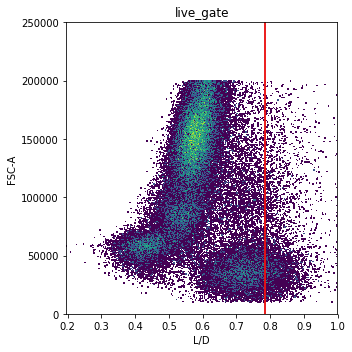

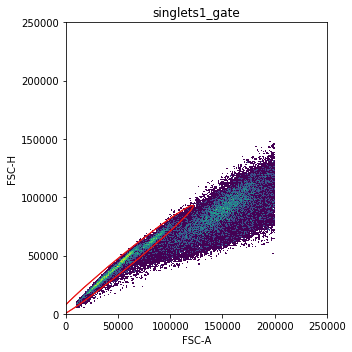

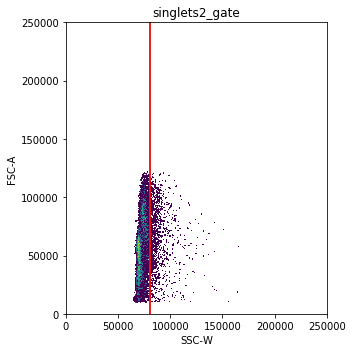

In [306]:
n = apply_template(samples[28])

In [307]:
n.remove_population('CD45+')
n.remove_population('CD45-')

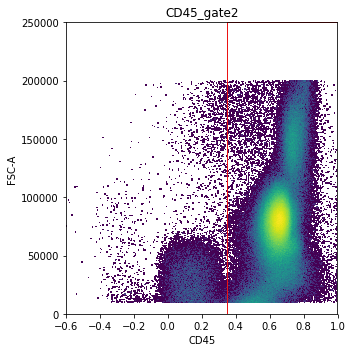

In [308]:
children = ChildPopulationCollection('geom')
children.add_population('CD45+', definition='+')
children.add_population('CD45-', definition='-')
kwargs = dict(x='CD45', y='FSC-A', transform_x='logicle', transform_y=None,
             x_min=0.35, y_min=0, x_max=1, y_max=250000)
n.create_gate(gate_name='CD45_gate2', 
              parent='cells',
              class_='Static',
              method='rect_gate',
              child_populations=children, 
              kwargs=kwargs)
n.apply('CD45_gate2')

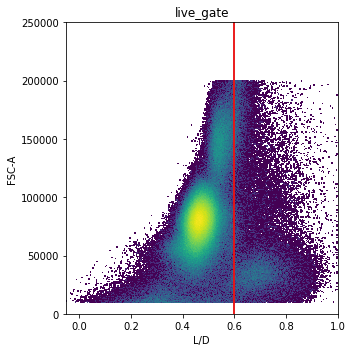

In [309]:
n.apply('live_gate')

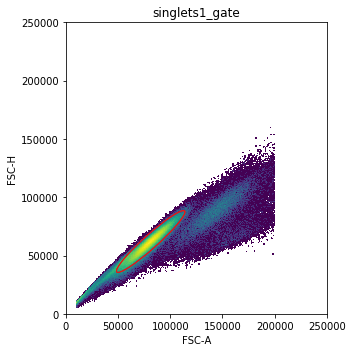

In [310]:
n.apply('singlets1_gate')

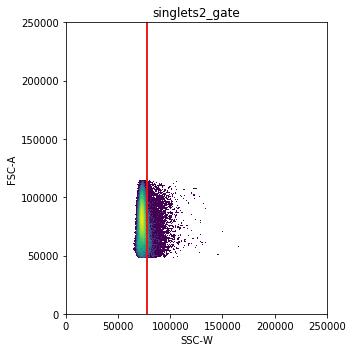

In [311]:
n.apply('singlets2_gate')

In [312]:
n.clean('Single_Live_CD45+')
n.save()

Saved successfully!


True

<h3>315-02</h3>

------------------ 315-02_pdmc_n ------------------
Applying boundary...
Applying CD45_gate...
Applying live_gate...
Applying singlets1_gate...
Applying singlets2_gate...
Complete!


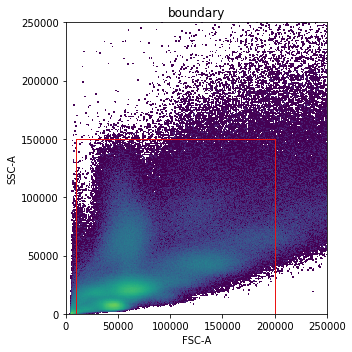

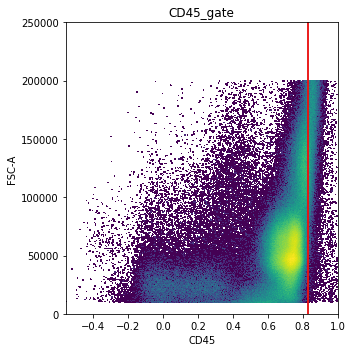

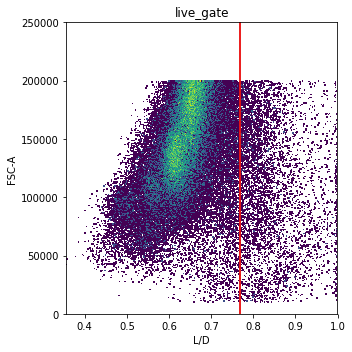

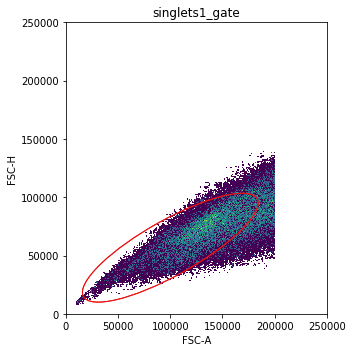

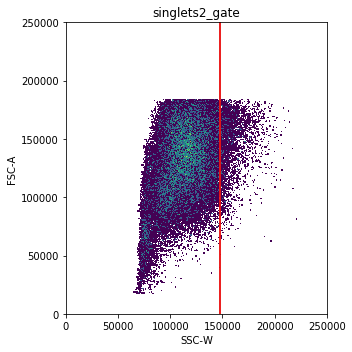

In [313]:
n = apply_template(samples[29])

In [314]:
n.remove_population('CD45+')
n.remove_population('CD45-')

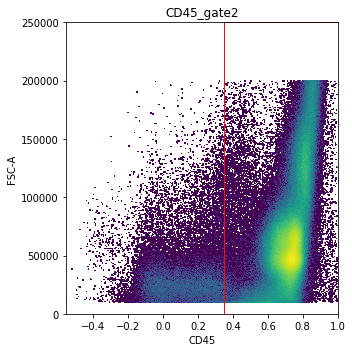

In [315]:
children = ChildPopulationCollection('geom')
children.add_population('CD45+', definition='+')
children.add_population('CD45-', definition='-')
kwargs = dict(x='CD45', y='FSC-A', transform_x='logicle', transform_y=None,
             x_min=0.35, y_min=0, x_max=1, y_max=250000)
n.create_gate(gate_name='CD45_gate2', 
              parent='cells',
              class_='Static',
              method='rect_gate',
              child_populations=children, 
              kwargs=kwargs)
n.apply('CD45_gate2')

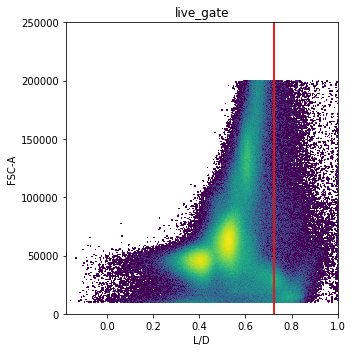

In [316]:
n.apply('live_gate')

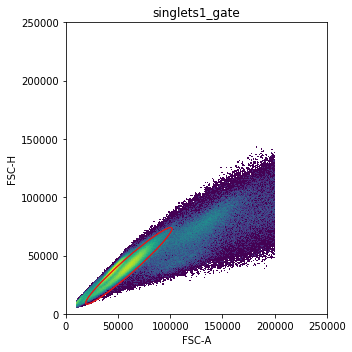

In [317]:
n.apply('singlets1_gate')

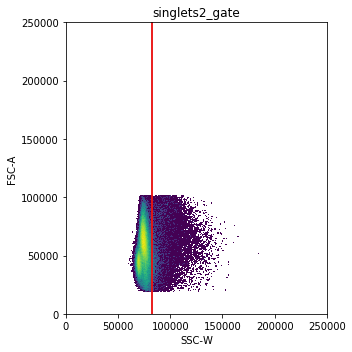

In [318]:
n.apply('singlets2_gate')

In [319]:
n.clean('Single_Live_CD45+')
n.save()

Saved successfully!


True

<h3>318-01</h3>

------------------ 318-01_pdmc_n ------------------
Applying boundary...
Applying CD45_gate...
Applying live_gate...
Applying singlets1_gate...
Applying singlets2_gate...
Complete!


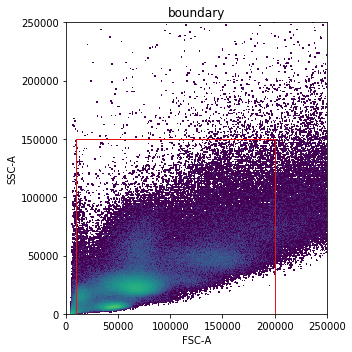

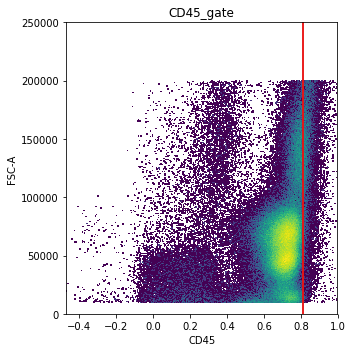

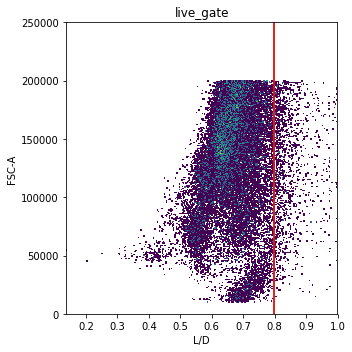

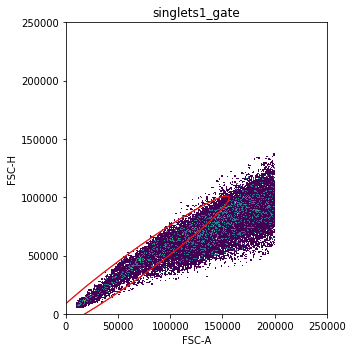

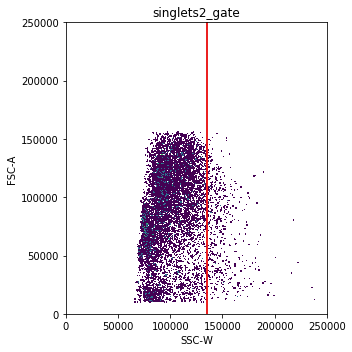

In [326]:
n = apply_template(samples[30])

In [327]:
n.remove_population('CD45+')
n.remove_population('CD45-')

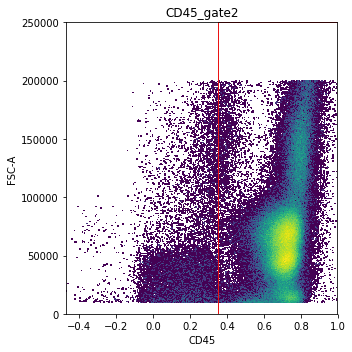

In [328]:
children = ChildPopulationCollection('geom')
children.add_population('CD45+', definition='+')
children.add_population('CD45-', definition='-')
kwargs = dict(x='CD45', y='FSC-A', transform_x='logicle', transform_y=None,
             x_min=0.35, y_min=0, x_max=1, y_max=250000)
n.create_gate(gate_name='CD45_gate2', 
              parent='cells',
              class_='Static',
              method='rect_gate',
              child_populations=children, 
              kwargs=kwargs)
n.apply('CD45_gate2')

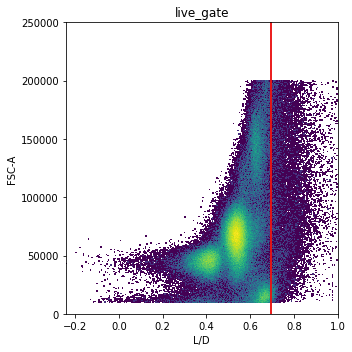

In [329]:
n.apply('live_gate')

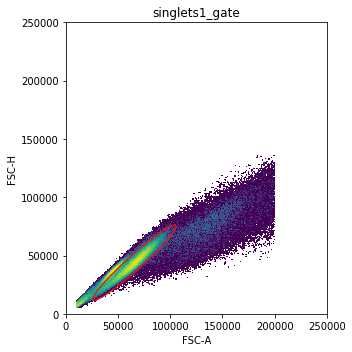

In [324]:
n.apply('singlets1_gate')

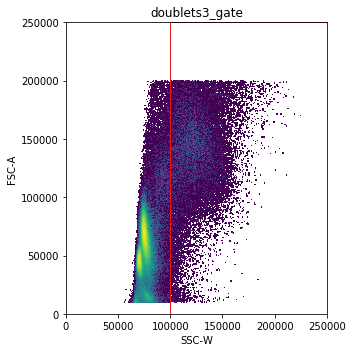

In [330]:
children = ChildPopulationCollection('geom')
children.add_population('Single_Live_CD45+', definition='-')
children.add_population('doublets3', definition='+')
kwargs = dict(x='SSC-W', y='FSC-A', transform_x=None, transform_y=None,
             x_min=100000, y_min=0, x_max=250000, y_max=250000)
n.create_gate(gate_name='doublets3_gate', 
              parent='Live_CD45+',
              class_='Static',
              method='rect_gate',
              child_populations=children, 
              kwargs=kwargs)
n.apply('doublets3_gate')

In [331]:
n.clean('Single_Live_CD45+')
n.save()

Saved successfully!


True

------------------ 320-01_pdmc_n ------------------
Applying boundary...
Applying CD45_gate...
Applying live_gate...
Applying singlets1_gate...
Applying singlets2_gate...
Complete!


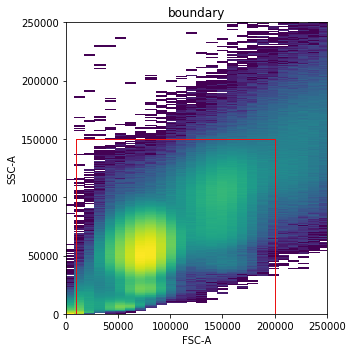

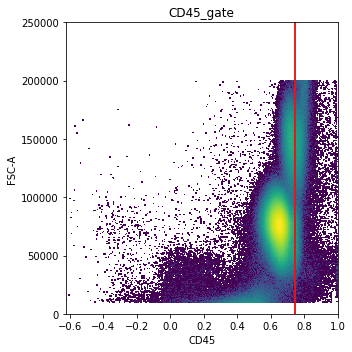

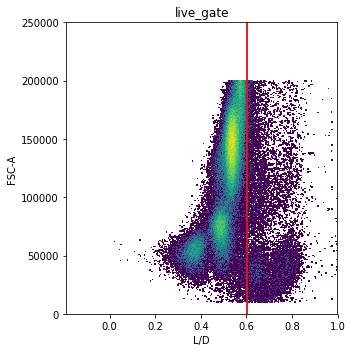

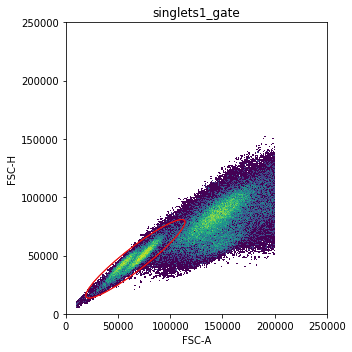

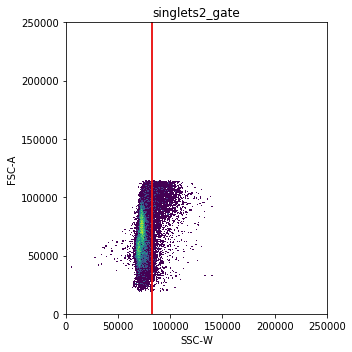

In [334]:
n = apply_template(samples[31])

In [335]:
n.remove_population('CD45+')
n.remove_population('CD45-')

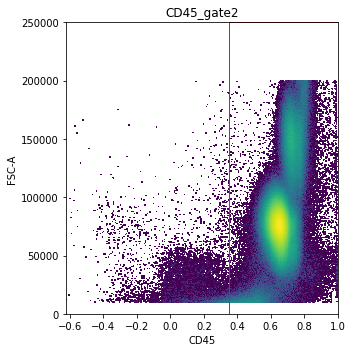

In [336]:
children = ChildPopulationCollection('geom')
children.add_population('CD45+', definition='+')
children.add_population('CD45-', definition='-')
kwargs = dict(x='CD45', y='FSC-A', transform_x='logicle', transform_y=None,
             x_min=0.35, y_min=0, x_max=1, y_max=250000)
n.create_gate(gate_name='CD45_gate2', 
              parent='cells',
              class_='Static',
              method='rect_gate',
              child_populations=children, 
              kwargs=kwargs)
n.apply('CD45_gate2')

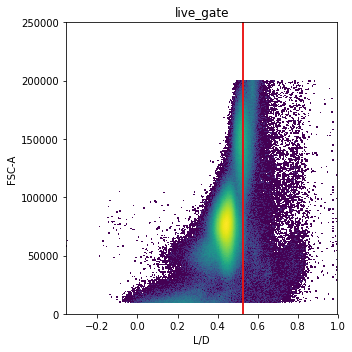

In [337]:
n.apply('live_gate')

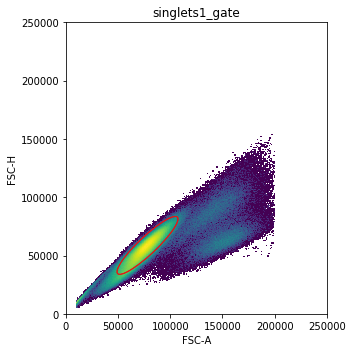

In [338]:
n.apply('singlets1_gate')

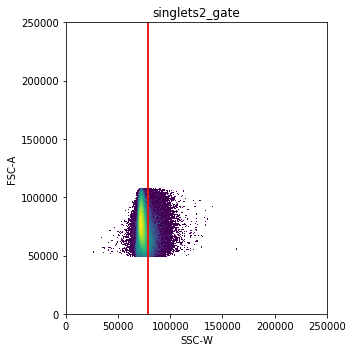

In [339]:
n.apply('singlets2_gate')

In [340]:
n.remove_population('Single_Live_CD45+')

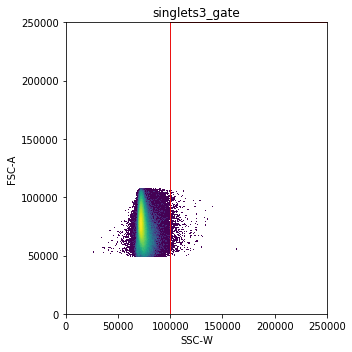

In [341]:
children = ChildPopulationCollection('geom')
children.add_population('doublets4', definition='+')
children.add_population('Single_Live_CD45+', definition='-')
kwargs = dict(x='SSC-W', y='FSC-A', transform_x=None, transform_y=None,
             x_min=100000, y_min=0, x_max=250000, y_max=250000)
n.create_gate(gate_name='singlets3_gate', 
              parent='singlets1',
              class_='Static',
              method='rect_gate',
              child_populations=children, 
              kwargs=kwargs)
n.apply('singlets3_gate')

In [342]:
n.clean('Single_Live_CD45+')
n.save()

Saved successfully!


True

<h3>321-01</h3>

------------------ 321-01_pdmc_n ------------------
Applying boundary...
Applying CD45_gate...
Applying live_gate...
Applying singlets1_gate...
Applying singlets2_gate...
Complete!


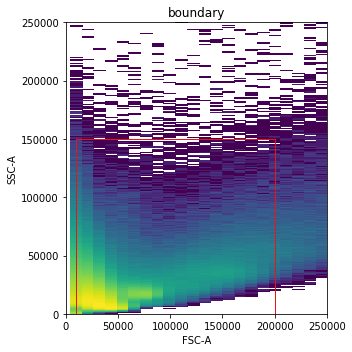

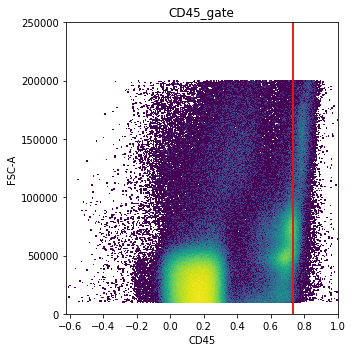

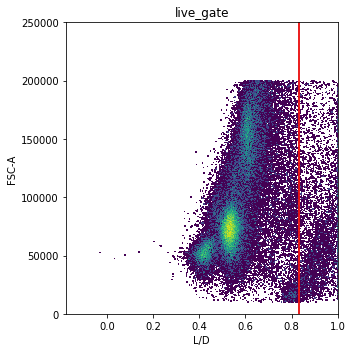

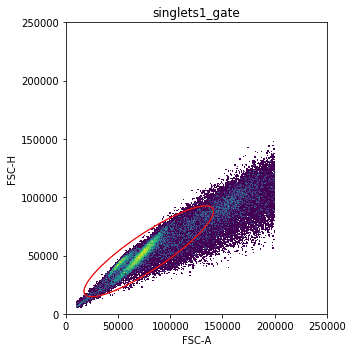

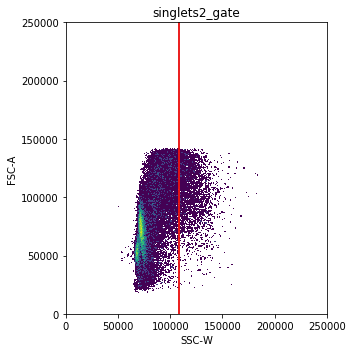

In [350]:
n = apply_template(samples[32])

In [351]:
n.remove_population('CD45+')
n.remove_population('CD45-')

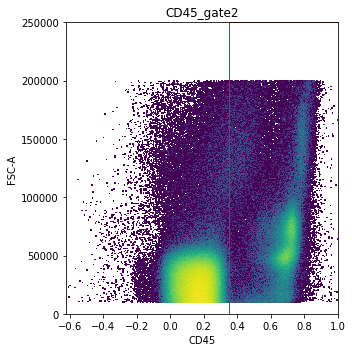

In [352]:
children = ChildPopulationCollection('geom')
children.add_population('CD45+', definition='+')
children.add_population('CD45-', definition='-')
kwargs = dict(x='CD45', y='FSC-A', transform_x='logicle', transform_y=None,
             x_min=0.35, y_min=0, x_max=1, y_max=250000)
n.create_gate(gate_name='CD45_gate2', 
              parent='cells',
              class_='Static',
              method='rect_gate',
              child_populations=children, 
              kwargs=kwargs)
n.apply('CD45_gate2')

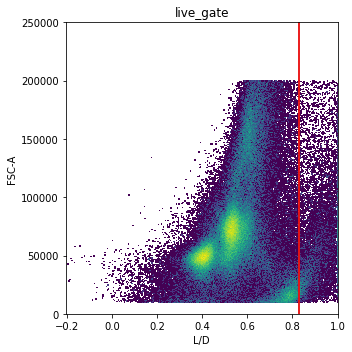

In [353]:
n.apply('live_gate')

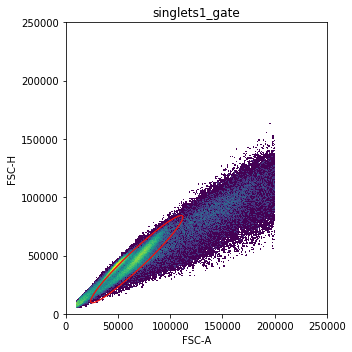

In [354]:
n.apply('singlets1_gate')

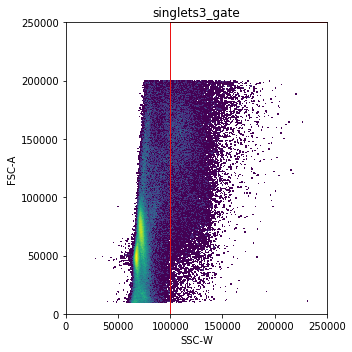

In [355]:
children = ChildPopulationCollection('geom')
children.add_population('doublets2', definition='+')
children.add_population('Single_Live_CD45+', definition='-')
kwargs = dict(x='SSC-W', y='FSC-A', transform_x=None, transform_y=None,
             x_min=100000, y_min=0, x_max=250000, y_max=250000)
n.create_gate(gate_name='singlets3_gate', 
              parent='Live_CD45+',
              class_='Static',
              method='rect_gate',
              child_populations=children, 
              kwargs=kwargs)
n.apply('singlets3_gate')

In [356]:
n.clean('Single_Live_CD45+')
n.save()

Saved successfully!


True

<h3>322-01</h3>

------------------ 322-01_pdmc_n ------------------
Applying boundary...
Applying CD45_gate...
Applying live_gate...
Applying singlets1_gate...
Applying singlets2_gate...
Complete!


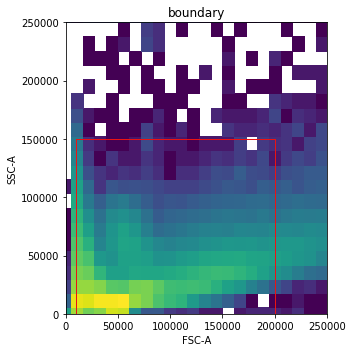

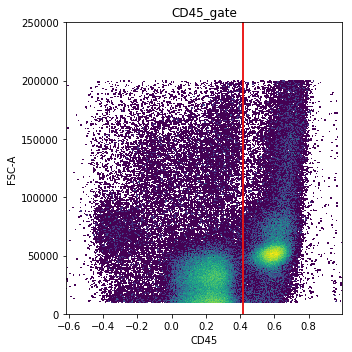

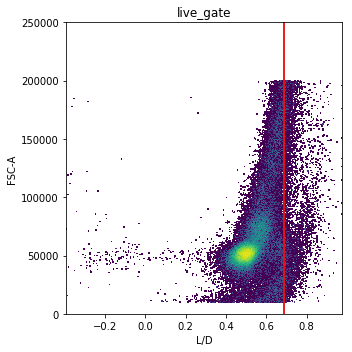

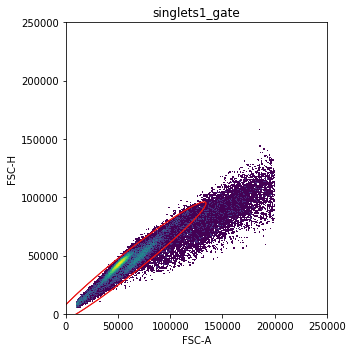

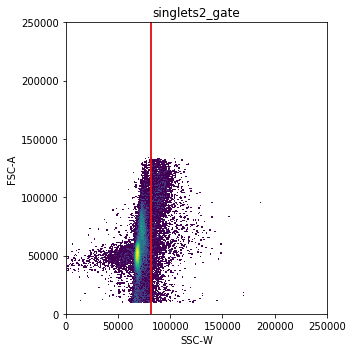

In [357]:
n = apply_template(samples[33])

In [358]:
n.clean('Single_Live_CD45+')
n.save()

Saved successfully!


True

<h3>323-01</h3>

------------------ 323-01_pdmc_n ------------------
Applying boundary...
Applying CD45_gate...
Applying live_gate...
Applying singlets1_gate...
Applying singlets2_gate...
Complete!


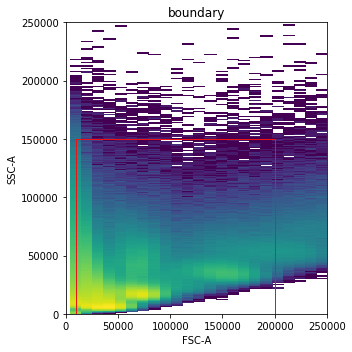

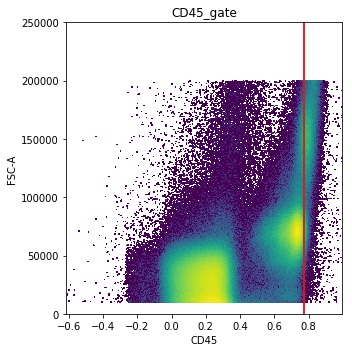

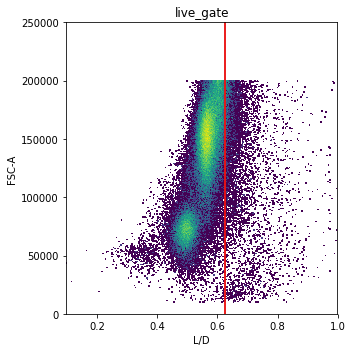

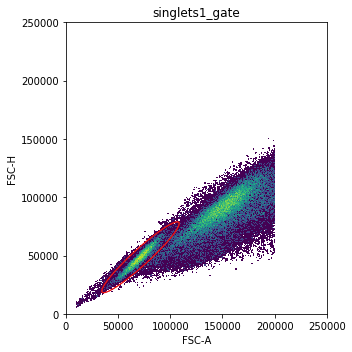

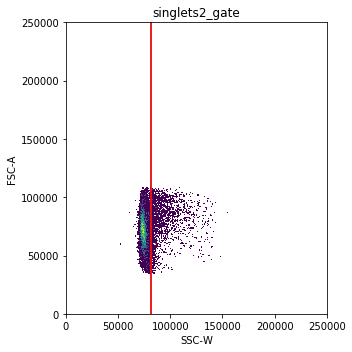

In [359]:
n = apply_template(samples[34])

In [360]:
n.remove_population('CD45+')
n.remove_population('CD45-')

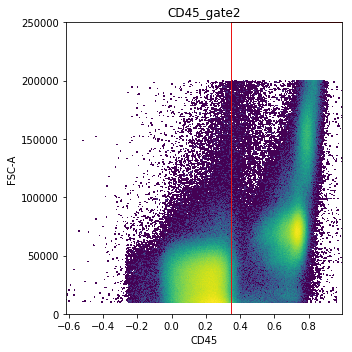

In [361]:
children = ChildPopulationCollection('geom')
children.add_population('CD45+', definition='+')
children.add_population('CD45-', definition='-')
kwargs = dict(x='CD45', y='FSC-A', transform_x='logicle', transform_y=None,
             x_min=0.35, y_min=0, x_max=1, y_max=250000)
n.create_gate(gate_name='CD45_gate2', 
              parent='cells',
              class_='Static',
              method='rect_gate',
              child_populations=children, 
              kwargs=kwargs)
n.apply('CD45_gate2')

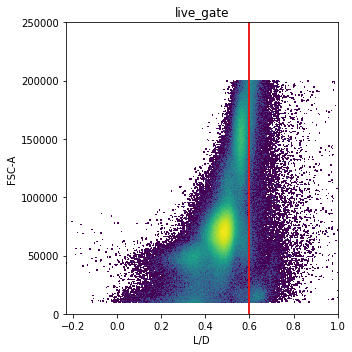

In [362]:
n.apply('live_gate')

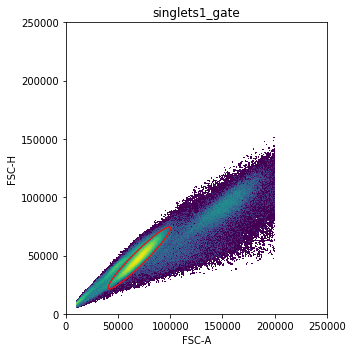

In [363]:
n.apply('singlets1_gate')

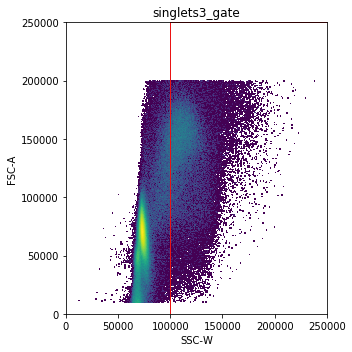

In [364]:
children = ChildPopulationCollection('geom')
children.add_population('doublets3', definition='+')
children.add_population('Single_Live_CD45+', definition='-')
kwargs = dict(x='SSC-W', y='FSC-A', transform_x='logicle', transform_y=None,
             x_min=100000, y_min=0, x_max=250000, y_max=250000)
n.create_gate(gate_name='singlets3_gate', 
              parent='Live_CD45+',
              class_='Static',
              method='rect_gate',
              child_populations=children, 
              kwargs=kwargs)
n.apply('singlets3_gate')

In [365]:
n.clean('Single_Live_CD45+')
n.save()

Saved successfully!


True

<h3>324-01</h3>

------------------ 324-01_pdmc_n ------------------
Applying boundary...
Applying CD45_gate...
Applying live_gate...
Applying singlets1_gate...
Applying singlets2_gate...
Complete!


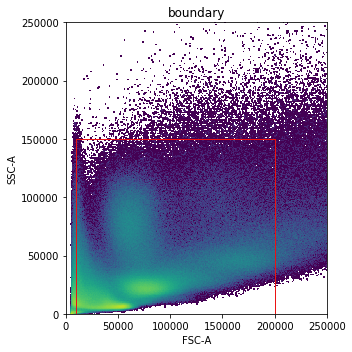

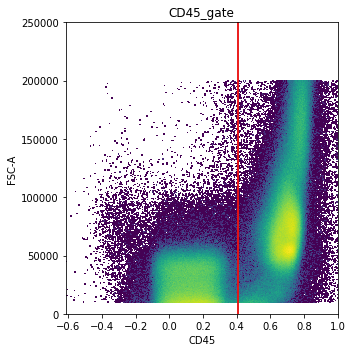

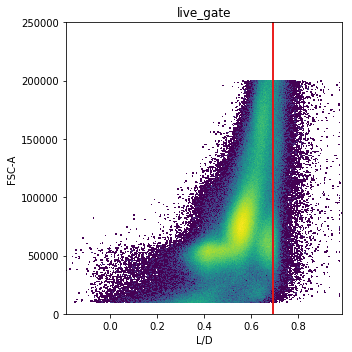

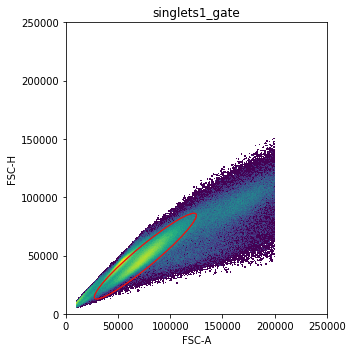

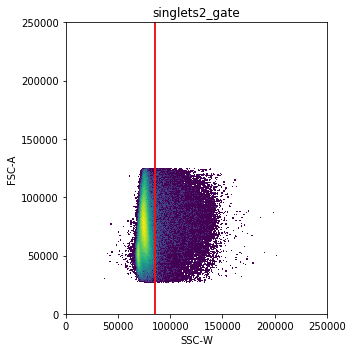

In [366]:
n = apply_template(samples[35])

In [367]:
n.clean('Single_Live_CD45+')
n.save()

Saved successfully!


True

<h3>326-01</h3>

------------------ 326-01_pdmc_n ------------------
Applying boundary...
Applying CD45_gate...
Applying live_gate...
Applying singlets1_gate...
Applying singlets2_gate...
Complete!


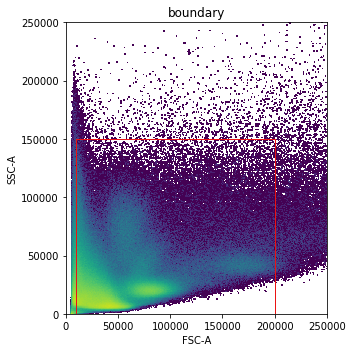

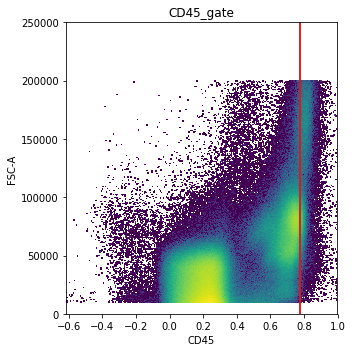

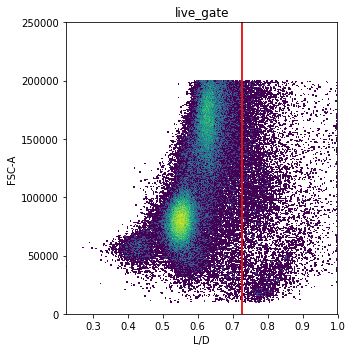

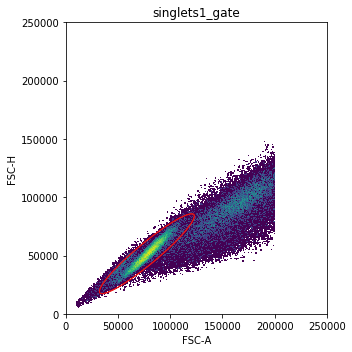

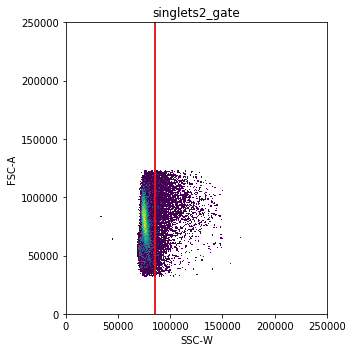

In [368]:
n = apply_template(samples[36])

In [369]:
n.remove_population('CD45+')
n.remove_population('CD45-')

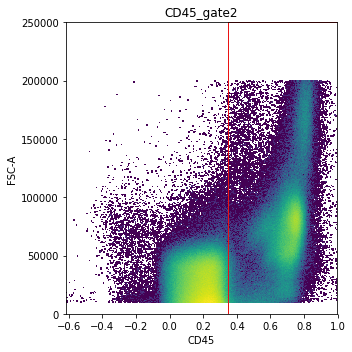

In [370]:
children = ChildPopulationCollection('geom')
children.add_population('CD45+', definition='+')
children.add_population('CD45-', definition='-')
kwargs = dict(x='CD45', y='FSC-A', transform_x='logicle', transform_y=None,
             x_min=0.35, y_min=0, x_max=1, y_max=250000)
n.create_gate(gate_name='CD45_gate2', 
              parent='cells',
              class_='Static',
              method='rect_gate',
              child_populations=children, 
              kwargs=kwargs)
n.apply('CD45_gate2')

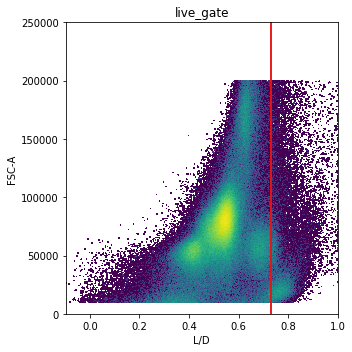

In [371]:
n.apply('live_gate')

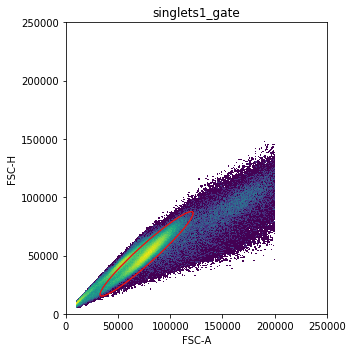

In [372]:
n.apply('singlets1_gate')

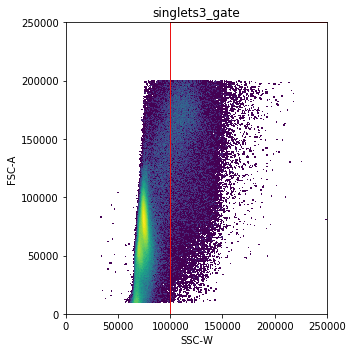

In [373]:
children = ChildPopulationCollection('geom')
children.add_population('doublets3', definition='+')
children.add_population('Single_Live_CD45+', definition='-')
kwargs = dict(x='SSC-W', y='FSC-A', transform_x=None, transform_y=None,
             x_min=100000, y_min=0, x_max=250000, y_max=250000)
n.create_gate(gate_name='singlets3_gate', 
              parent='Live_CD45+',
              class_='Static',
              method='rect_gate',
              child_populations=children, 
              kwargs=kwargs)
n.apply('singlets3_gate')

In [374]:
n.clean('Single_Live_CD45+')
n.save()

Saved successfully!


True